<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/Generative-CDTL_0913.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [6]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [7]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [8]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [9]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [10]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [11]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [12]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    if train_opt.weight_init:
        adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)

    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = 0.9

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            #loss =  g_loss + a_loss #+ torch.std(torch.tensor((g_loss,a_loss)))
            loss =  lambda1*g_loss + (1-lambda1)*a_loss
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [13]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [14]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [15]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [16]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [17]:

def draw_chart(axis,legends,title, df,color,showfliers=True):
    if legends == None:
        legends = []

    legends.append((title,color))

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df.T.plot.box(ax=axis, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df.T.plot.box(ax=axis, showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df.T.median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def set_legend(axis,legends,title):
    axis.set_title(title,fontdict={'fontsize':10})
    #axis.legend([v for v,c in legends],ncol=len(legends),bbox_to_anchor=(1.05, 1.0), loc='upper left')
    axis.legend([v for v,c in legends],bbox_to_anchor=(1.05, 1.0), loc='upper left')
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)

def prepare_result_data():
    result_data = {} # Original
    train_data = {}
    result_table = {}
    result_table['Trial']=[]
    result_table['Testset F1']=[]
    result_table['Initial F1']=[]
    result_table['Mean F1']=[]
    result_table['Last F1']=[]
    result_table['Elapsed time']=[]
    return result_data,train_data,result_table

def set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,result_data,train_data,result_table):
    result_data[f'T{idx}'] = tad
    result_table['Trial'].append(idx)
    train_data[f'T{idx}'] = (df_loss,df_mis,df_drf)
    result_table['Testset F1'].append(tad[0])
    result_table['Initial F1'].append(tad[1])
    result_table['Mean F1'].append(np.mean(tad))
    result_table['Last F1'].append(tad[-1])
    result_table['Elapsed time'].append(et)

def set_mean_sem(df):
    df.loc[len(df)] = df.median()
    df.loc[len(df)] = df[0:len(df)-1].std()
    df.at[len(df)-2,'Trial'] = 'median'
    df.at[len(df)-1,'Trial'] = 'std'

In [18]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            #org_discriminators.append(last_discriminator)
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)
            print('Normal model mean        :',np.mean(nor_result_table['Mean F1']))
            print('G-CDTL model mean:',np.mean(gcd_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

## SEA

In [19]:

class Ensemble_SEA():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model(data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                self.models.pop(hist_f1.index(min_f1))
                self.models.append(model)
        else:
            self.models.append(model)

    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        return np.mean(np.asarray([m(data).cpu().data.numpy() for m in self.models]),axis=0)


## AUE2

In [20]:

class Ensemble_AUE2():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.weights = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(f_data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, f_target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss
        return (discriminator,loss.cpu().data.numpy())

    def calc_loss(self,data,target):
        self.weights = []
        bce_loss = nn.BCELoss()
        for m in self.models:
            loss = bce_loss(m(data), target.reshape(-1,1))
            self.weights.append(loss.cpu().data.numpy())


    def add_model(self,model,data,target):
        # model = (model,loss)
        # 여기서 m은 실제 model 이고, loss는 weight를 계산하기 위해서...
        # model[0] -> model
        # model[1] -> loss
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model[0](data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                pop_index = hist_f1.index(min_f1)
                self.models.pop(pop_index)
                self.models.append(model[0])
            self.calc_loss(data,target)
        elif len(self.models) == 0:
            self.models.append(model[0])
            self.weights.append(model[1])
        else:
            self.models.append(model[0])
            self.calc_loss(data,target)

    def predict(self,data):

        weights = np.asarray([1/w for w in self.weights])
        normalized_weights = weights / np.linalg.norm(weights)
        return np.sum(np.asarray([normalized_weights[i]*m(data).cpu().data.numpy() for i,m in enumerate(self.models)]),axis=0)


## DTEL

In [21]:

class Ensemble_DTEL():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        self.data = data
        self.target = target
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        self.epoch = epoch
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
            bce_loss = nn.BCELoss()
            optimizer = torch.optim.Adam(self.transfered_model.parameters(), lr=0.001)
            for itr in range(self.epoch):
                predicted_y = self.transfered_model(self.data).reshape(-1,1)
                loss = bce_loss(predicted_y, self.target.reshape(-1,1))
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)


In [22]:

def compare_algorithm(discriminator,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = X_live_unit.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        new_model = ensemble.train_new_model(b_dim,4000,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit)
        ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    print('Early stop at ',np.mean(ensemble.early_stop_at))

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'Mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [23]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant2(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,weight_init = False):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=2000, k=5, lr_g=lr_g, lr_f=0.001, lr_r=0.001,weight_init=weight_init)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #AUE
    aue_result_data,aue_train_data,aue_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            org_discriminators.append((last_discriminator,df_loss['Predictor loss'][-1:].values[0]))
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)

            print('Normal model median        :',np.median(nor_result_table['Mean F1']))
            print('Drift tolerant model median:',np.median(gcd_result_table['Mean F1']))

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/2) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)
            ensemble_sea = Ensemble_SEA(3,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx][0],None,None)

            ensemble_aue = Ensemble_AUE2(3,retrain_interval)
            ensemble_aue.add_model(org_discriminators[idx],None,None)

            ensemble_dte = Ensemble_DTEL(3,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx][0],None,None)

        else:

            # f1 은 normal model과 같다.

            idx = len(sea_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for SEA ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,sea_result_data,sea_train_data,sea_result_table)
            print('SEA median:',np.median(sea_result_table['Mean F1']))

            print(f'######################### Trial {idx} for AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_aue,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,aue_result_data,aue_train_data,aue_result_table)
            print('AUE median:',np.median(aue_result_table['Mean F1']))

            print(f'######################### Trial {idx} for DTEL ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,dte_result_data,dte_train_data,dte_result_table)
            print('DTEL median:',np.median(dte_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    AUE_df = pd.DataFrame(aue_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    aue_statistics_df = pd.DataFrame(aue_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(aue_statistics_df)
    set_mean_sem(dte_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL without outlier')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    print('@ Normal model')
    display(original_statistics_df)
    print('@ SEA')
    display(sea_statistics_df)
    print('@ AUE2')
    display(aue_statistics_df)
    print('@ DTEL')
    display(dte_statistics_df)
    print('@ G-CDTL')
    display(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    # mean f1
    box = ax[0].boxplot([original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 drift_statistics_df['Mean F1'][0:trial_count].values] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(drift_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 for each algorithm')

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 drift_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(drift_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm')

    plt.show()

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

# 이론

## A Streaming Ensemble Algorithm (SEA)
+ https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=3d9f3f1f85c1f854060285fd95fd476dfed2c808

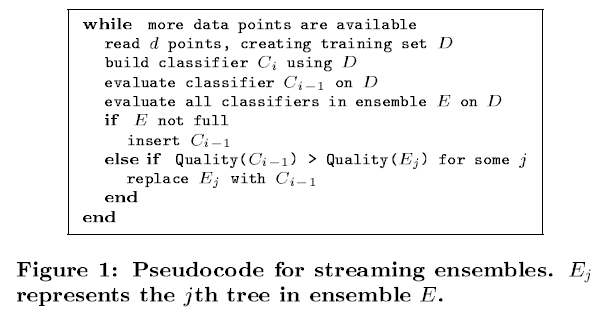

## Reacting to Different Types of Concept Drift:The Accuracy Updated Ensemble Algorithm (AUE2)

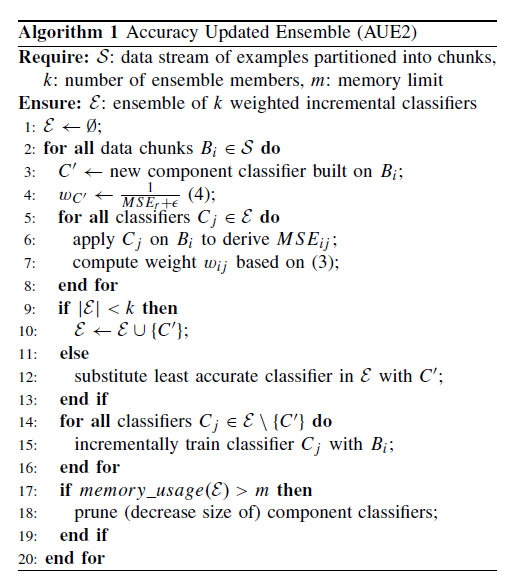

## Concept Drift Adaptation by Exploiting HistoricalKnowledge (DTEL)

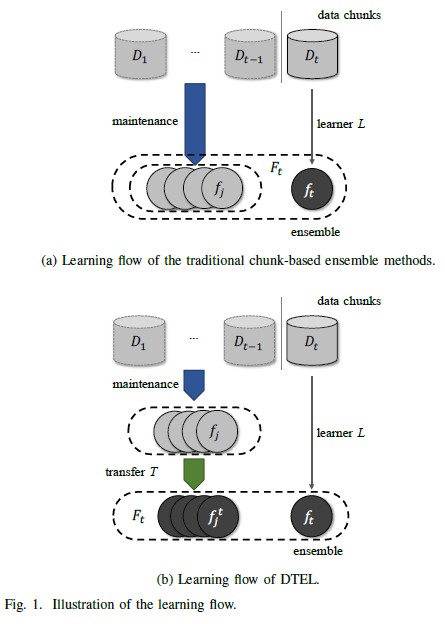

## Generative-CDTL

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} L_D + L_G
\tag{23}
$$

$$
\min_{G(.)} L_D + L_G+ std(L_1,L_2)
\tag{24}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [24]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [25]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [26]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


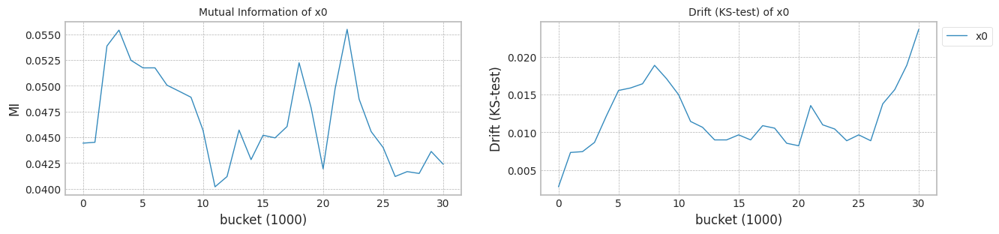

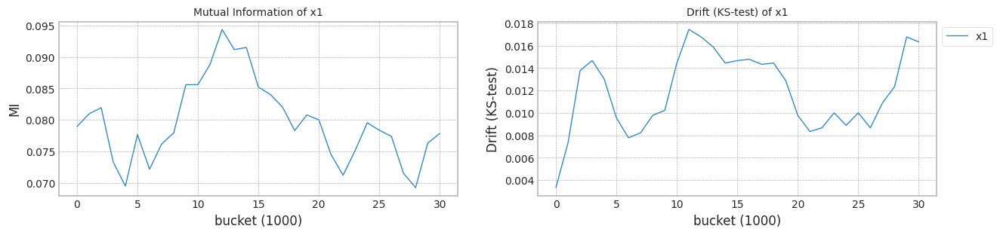

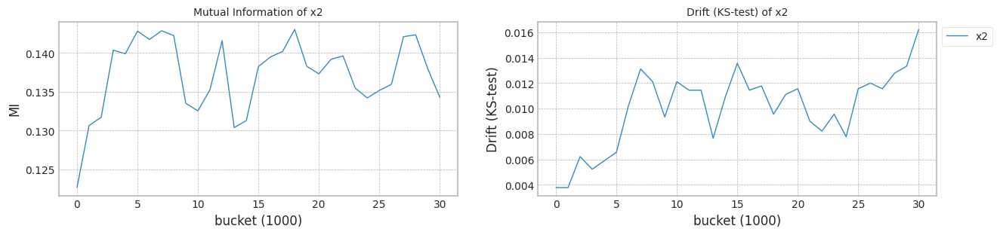

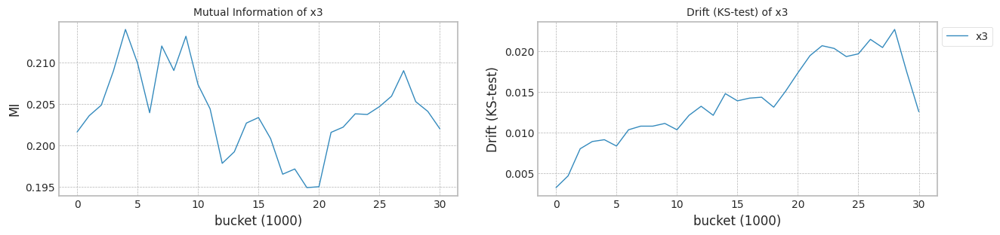

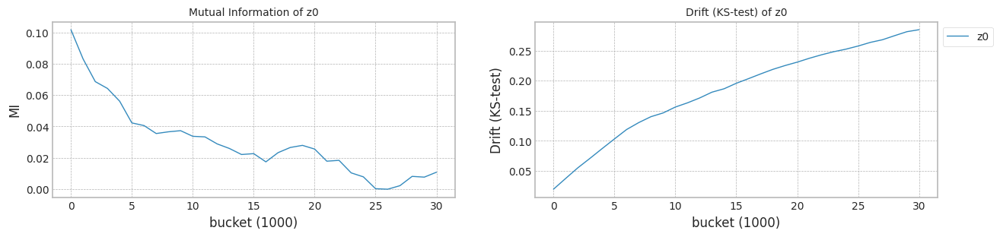

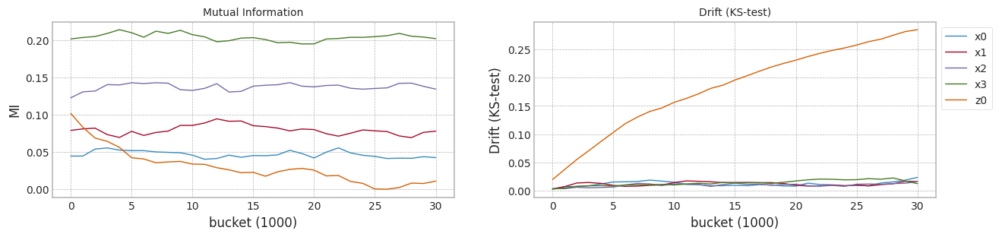

In [27]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [28]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.421766,0
1,0.447230,0.556479,0.629077,0.735705,0.529014,0
2,0.489501,0.704159,0.760582,0.582973,0.570549,0
3,0.581446,0.301839,0.443337,0.515173,0.396001,0
4,0.571642,0.639275,0.524701,0.583380,0.561748,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.185740,39
39996,0.426322,0.302644,0.484909,0.587518,0.721101,39
39997,0.374186,0.587769,0.624447,0.598315,0.489479,39
39998,0.470439,0.265430,0.218971,0.645349,1.258888,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 500.04it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.16it/s]


Test f1 score: 0.8806629834254144
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.046631
x1    0.122459
x2    0.271004
x3    0.097466
z0    0.572290
dtype: float64
Mean F1 for all data: 0.7729881430176123
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7729881430176123
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.42it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.90it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.86it/s]


Test f1 score: 0.8790429774036331
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.317398
x1    0.189982
x2    0.092581
x3    0.079018
z0    0.333441
dtype: float64
Mean F1 for all data: 0.8420427106446057
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.807515426831109
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.68it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.98it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.49it/s]


Test f1 score: 0.8778550148957298
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.02it/s]


mean of drift:
x0    0.026971
x1    0.084505
x2    0.066452
x3    0.101477
z0    0.214749
dtype: float64
Mean F1 for all data: 0.8184939950827093
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8184939950827093
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 605.26it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.87it/s]


Test f1 score: 0.8804658316853439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.110753
x1    0.407473
x2    0.164613
x3    0.139419
z0    0.735710
dtype: float64
Mean F1 for all data: 0.69389958057371
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7957410690501607
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.38it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.51it/s]


Test f1 score: 0.8785251838033579
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.110581
x1    0.146079
x2    0.087885
x3    0.071039
z0    0.230953
dtype: float64
Mean F1 for all data: 0.8193326851861487
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8184939950827093
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.68it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.52it/s]


Test f1 score: 0.8791160220994475
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.186158
x1    0.410297
x2    0.202692
x3    0.126796
z0    0.249061
dtype: float64
Mean F1 for all data: 0.8474193217026977
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.818913340134429
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.15it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.48it/s]


Test f1 score: 0.8793595086641807
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.059376
x1    0.119892
x2    0.122097
x3    0.101168
z0    0.186373
dtype: float64
Mean F1 for all data: 0.8190827657251464
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8190827657251464
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 617.20it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.65it/s]


Test f1 score: 0.878345498783455
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.087814
x1    0.092921
x2    0.266706
x3    0.129065
z0    0.372158
dtype: float64
Mean F1 for all data: 0.8547477678635323
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8192077254556476
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 615.51it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.99it/s]


Test f1 score: 0.8816587625454946
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.455265
x1    0.184039
x2    0.126201
x3    0.099599
z0    0.702814
dtype: float64
Mean F1 for all data: 0.8399938976495513
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8193326851861487
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 624.22it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.91it/s]


Test f1 score: 0.8784530386740331
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.301215
x1    0.306244
x2    0.074649
x3    0.039054
z0    0.381047
dtype: float64
Mean F1 for all data: 0.8587830415512402
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.82966329141785
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.40it/s]


Test f1 score: 0.8760039608317748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929917617670544
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.47it/s]


Test f1 score: 0.8790456202363857
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.336036
x1    0.012878
x2    0.083190
x3    0.042871
z0    0.379369
dtype: float64
Mean F1 for all data: 0.8510538113219472
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8399938976495513
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.42it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955867355507644
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.07it/s]


Test f1 score: 0.8821845408500331
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.144258
x1    0.159957
x2    0.231007
x3    0.083262
z0    0.609384
dtype: float64
Mean F1 for all data: 0.7461372871903255
Normal model median        : 0.7958303781758421
Drift tolerant model median: 0.82966329141785
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.07it/s]


Test f1 score: 0.8775869660942317
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973975743331257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.40it/s]


Test f1 score: 0.8807379749615638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.023953
x1    0.055889
x2    0.276341
x3    0.073065
z0    0.489208
dtype: float64
Mean F1 for all data: 0.7319661296187452
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8193326851861487
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.46it/s]


Test f1 score: 0.8768451200705001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945196654210102
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.69it/s]


Test f1 score: 0.8798758865248227
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.156573
x1    0.064717
x2    0.308294
x3    0.194534
z0    0.532384
dtype: float64
Mean F1 for all data: 0.8199143740047148
Normal model median        : 0.7958303781758421
Drift tolerant model median: 0.8196235295954317
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 663.99it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937904967363878
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.11it/s]


Test f1 score: 0.8821585903083701
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.093685
x1    0.232864
x2    0.275943
x3    0.225900
z0    0.551982
dtype: float64
Mean F1 for all data: 0.8413280176336628
Normal model median        : 0.7955867355507644
Drift tolerant model median: 0.8199143740047148
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 659.75it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7951643405489799
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.04it/s]


Test f1 score: 0.8807480748074807
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.064889
x1    0.123552
x2    0.034763
x3    0.043624
z0    0.285244
dtype: float64
Mean F1 for all data: 0.7986562593556391
Normal model median        : 0.7955043989559221
Drift tolerant model median: 0.8196235295954317
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.47it/s]


Test f1 score: 0.8770077007700771
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918565965756301
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.26it/s]


Test f1 score: 0.8786101582383535
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.366226
x1    0.329742
x2    0.318100
x3    0.193849
z0    0.626889
dtype: float64
Mean F1 for all data: 0.78870257904291
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8193326851861487
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.64it/s]


Test f1 score: 0.8765554454355248
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948654108354687
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.97it/s]


Test f1 score: 0.8786139924961376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.157989
x1    0.277581
x2    0.302387
x3    0.312430
z0    0.564022
dtype: float64
Mean F1 for all data: 0.820696574394328
Normal model median        : 0.7953190304992788
Drift tolerant model median: 0.8196235295954317
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.96it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930409097238863
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.60it/s]


Test f1 score: 0.8800176444640494
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.073380
x1    0.423237
x2    0.090312
x3    0.148774
z0    0.244943
dtype: float64
Mean F1 for all data: 0.8357336542853494
Normal model median        : 0.795215998637478
Drift tolerant model median: 0.8199143740047148
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 650.82it/s]


Test f1 score: 0.8763125898087764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973400556614291
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.91it/s]


Test f1 score: 0.8795938638119413
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.051312
x1    0.209455
x2    0.117176
x3    0.070022
z0    0.161609
dtype: float64
Mean F1 for all data: 0.8228942533115365
Normal model median        : 0.7953190304992788
Drift tolerant model median: 0.8203054741995214
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.61it/s]


Early stop at  1993.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243517375300768
SEA median: 0.8243517375300768
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1668.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.835856911575391
AUE median: 0.835856911575391
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1002.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8433485682352667
DTEL median: 0.8433485682352667
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.21it/s]


Early stop at  1135.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8231319054403438
SEA median: 0.8237418214852104
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.51it/s]


Early stop at  2318.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.834315355186241
AUE median: 0.8350861333808159
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3298.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8437022658789876
DTEL median: 0.8435254170571271
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.31it/s]


Early stop at  2765.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243208408728334
SEA median: 0.8243208408728334
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.18it/s]


Early stop at  953.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349028475191784
AUE median: 0.8349028475191784
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.56it/s]


Early stop at  818.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8429571955970653
DTEL median: 0.8433485682352667
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1245.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8211118298861227
SEA median: 0.8237263731565886
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.58it/s]


Early stop at  2069.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8332143931858695
AUE median: 0.8346091013527097
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.30it/s]


Early stop at  2089.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8412140428266975
DTEL median: 0.843152881916166
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.72it/s]


Early stop at  1808.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8246513181569214
SEA median: 0.8243208408728334
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  1889.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349127466855325
AUE median: 0.8349028475191784
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  1881.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8435302078830809
DTEL median: 0.8433485682352667
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.21it/s]


Early stop at  1117.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8236069106158153
SEA median: 0.8239638757443244
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1784.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8347324296340368
AUE median: 0.8348176385766076
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.63it/s]


Early stop at  932.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8428539110142469
DTEL median: 0.843152881916166
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


Early stop at  773.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8228548671316331
SEA median: 0.8236069106158153
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349893020635462
AUE median: 0.8349028475191784
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  1716.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8433418225436211
DTEL median: 0.8433418225436211
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8257082670445534
SEA median: 0.8239638757443244
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.63it/s]


Early stop at  2059.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8362139564391823
AUE median: 0.8349077971023555
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.49it/s]


Early stop at  1389.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8428786221532011
DTEL median: 0.8431495090703431
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1748.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8277992556771446
SEA median: 0.8243208408728334
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.18it/s]


Early stop at  1185.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8361643994617816
AUE median: 0.8349127466855325
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1199.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8430939427075324
DTEL median: 0.8430939427075324
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.86it/s]


Early stop at  1578.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243900403734239
SEA median: 0.8243362892014552
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.23it/s]


Early stop at  918.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8346130852911309
AUE median: 0.8349077971023555
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.21it/s]


Early stop at  2709.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8417883549072162
DTEL median: 0.8430255691522988
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.51it/s]


Early stop at  2441.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8210176475398312
SEA median: 0.8243208408728334
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.58it/s]


Early stop at  2311.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.833349339517892
AUE median: 0.8349028475191784
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2139.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.841826044195695
DTEL median: 0.8429571955970653
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.01it/s]


Early stop at  1517.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8239830126091466
SEA median: 0.82415192674099
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8350913397133776
AUE median: 0.8349077971023555
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.61it/s]


Early stop at  1180.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8433447389434252
DTEL median: 0.8430255691522988
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2018.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243786991662359
SEA median: 0.8243208408728334
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8368078526882631
AUE median: 0.8349127466855325
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.76it/s]


Early stop at  683.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8429359564339763
DTEL median: 0.8429571955970653
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.22it/s]


Early stop at  1153.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8230347105249126
SEA median: 0.82415192674099
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.57it/s]


Early stop at  785.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8341381369455327
AUE median: 0.8349077971023555
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.25it/s]


Early stop at  2722.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8417155880550905
DTEL median: 0.8429465760155208
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.20it/s]


Early stop at  1358.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.821596109211227
SEA median: 0.8239830126091466
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.05it/s]


Early stop at  1545.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8332341137895628
AUE median: 0.8349028475191784
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1421.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8422679187728325
DTEL median: 0.8429359564339763
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.23it/s]


Early stop at  1171.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.824237565436629
SEA median: 0.8241102890228877
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349797655625018
AUE median: 0.8349077971023555
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  3930.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8413876725750091
DTEL median: 0.8429072892935887
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1895.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8204243217925972
SEA median: 0.8239830126091466
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2001.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8328944977663997
AUE median: 0.8349028475191784
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.69it/s]


Early stop at  712.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.842284541248665
DTEL median: 0.8428786221532011
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.32it/s]


Early stop at  1006.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8228054497431486
SEA median: 0.8237949616124809
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.32it/s]


Early stop at  1066.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8344281102550591
AUE median: 0.8348176385766076
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1642.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8423468065043608
DTEL median: 0.842866266583724
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.56it/s]


Early stop at  2414.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8215340307651912
SEA median: 0.8236069106158153
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3484.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8328604122291046
AUE median: 0.8347324296340368
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.66it/s]


Early stop at  894.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8422238353546958
DTEL median: 0.8428539110142469
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.06it/s]


Early stop at  1512.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8263412903924776
SEA median: 0.8237949616124809
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.80it/s]


Early stop at  1826.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8362662126754362
AUE median: 0.8348176385766076
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.64it/s]


Early stop at  936.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8439425694269295
DTEL median: 0.842866266583724


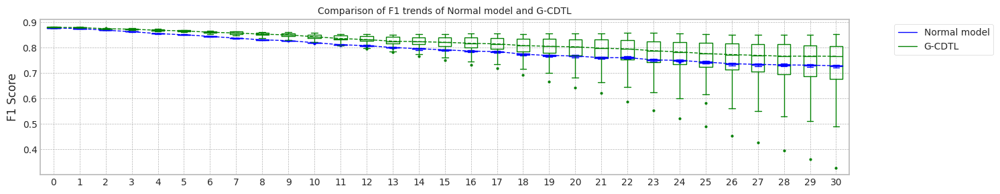

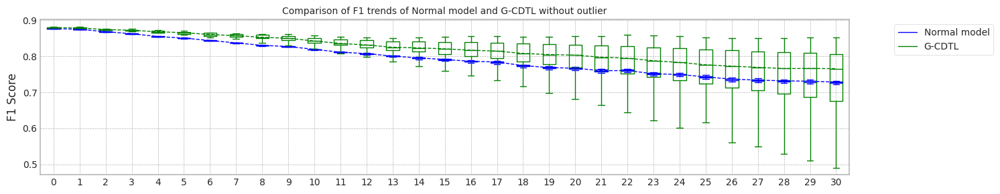

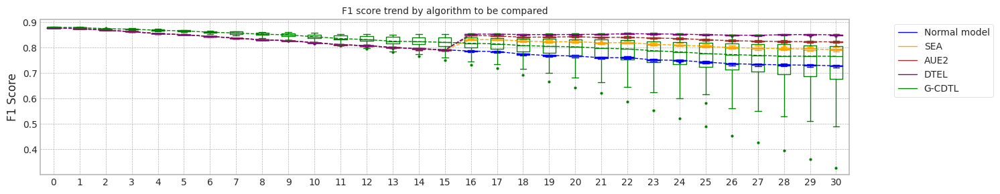

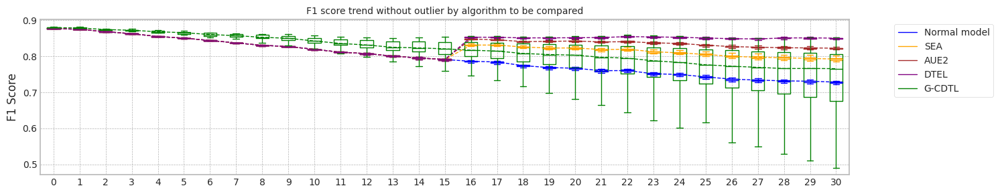

max_mean_trial= 9


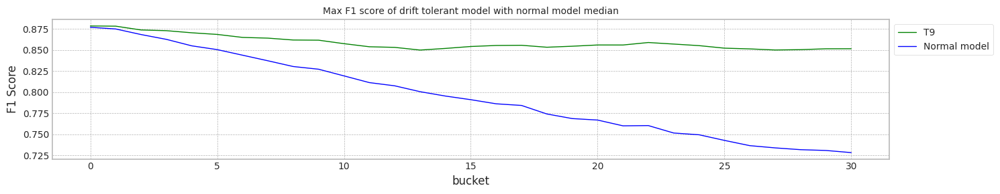

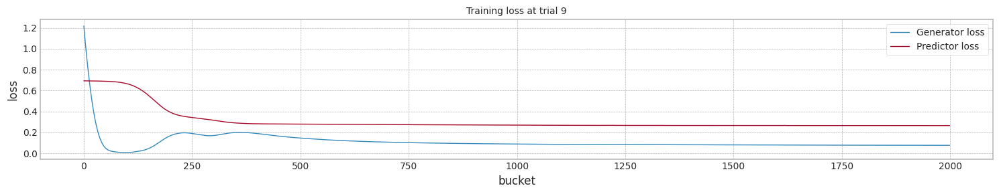

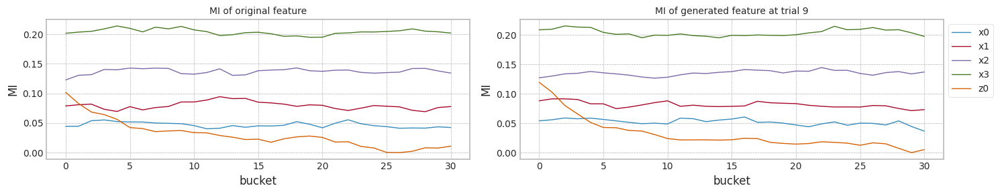

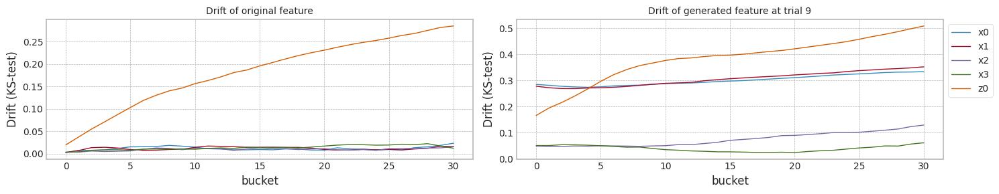

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.796925,0.731435,5.953314
1,1.0,0.877162,0.875152,0.794527,0.726733,6.344808
2,2.0,0.877387,0.875568,0.796229,0.728255,6.245382
3,3.0,0.876911,0.874931,0.792002,0.723297,5.932493
4,4.0,0.876736,0.874197,0.795422,0.728732,5.918758
5,5.0,0.876598,0.874281,0.796074,0.728989,6.031705
6,6.0,0.876721,0.874627,0.796302,0.728565,5.762276
7,7.0,0.877861,0.875580,0.796556,0.731794,5.864328
8,8.0,0.877822,0.875848,0.797355,0.731538,5.967004
9,9.0,0.877347,0.875234,0.795216,0.727756,5.983761


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.824352,0.794597,8.611196
1,1.0,0.877162,0.875152,0.823132,0.791923,7.377485
2,2.0,0.877387,0.875568,0.824321,0.791804,9.381212
3,3.0,0.876911,0.874931,0.821112,0.787178,7.767633
4,4.0,0.876736,0.874197,0.824651,0.796950,8.346922
5,5.0,0.876598,0.874281,0.823607,0.792863,7.378345
6,6.0,0.876721,0.874627,0.822855,0.789847,6.912730
7,7.0,0.877861,0.875580,0.825708,0.797539,10.851883
8,8.0,0.877822,0.875848,0.827799,0.805160,8.114326
9,9.0,0.877347,0.875234,0.824390,0.795498,8.061314


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.835857,0.824266,8.157860
1,1.0,0.877162,0.875152,0.834315,0.820941,8.849095
2,2.0,0.877387,0.875568,0.834903,0.822195,7.439593
3,3.0,0.876911,0.874931,0.833214,0.819862,8.675652
4,4.0,0.876736,0.874197,0.834913,0.822915,8.378379
5,5.0,0.876598,0.874281,0.834732,0.822397,8.200286
6,6.0,0.876721,0.874627,0.834989,0.822361,10.935109
7,7.0,0.877861,0.875580,0.836214,0.825159,8.571524
8,8.0,0.877822,0.875848,0.836164,0.825419,7.438246
9,9.0,0.877347,0.875234,0.834613,0.822376,7.347541


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.843349,0.851050,12.079132
1,1.0,0.877162,0.875152,0.843702,0.851791,14.603781
2,2.0,0.877387,0.875568,0.842957,0.851078,12.124074
3,3.0,0.876911,0.874931,0.841214,0.848819,13.493014
4,4.0,0.876736,0.874197,0.843530,0.851836,13.076458
5,5.0,0.876598,0.874281,0.842854,0.851266,11.793817
6,6.0,0.876721,0.874627,0.843342,0.852128,12.916749
7,7.0,0.877861,0.875580,0.842879,0.849747,12.491583
8,8.0,0.877822,0.875848,0.843094,0.848096,12.308852
9,9.0,0.877347,0.875234,0.841788,0.848921,14.031711


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.880663,0.879121,0.772988,0.630794,6.066117
1,1.0,0.879043,0.877540,0.842043,0.803827,5.951062
2,2.0,0.877855,0.877914,0.818494,0.764701,6.216498
3,3.0,0.880466,0.879541,0.693900,0.327743,5.928862
4,4.0,0.878525,0.878102,0.819333,0.766724,6.040930
5,5.0,0.879116,0.878319,0.847419,0.823107,5.877971
6,6.0,0.879360,0.878691,0.819083,0.764126,5.904282
7,7.0,0.878345,0.877352,0.854748,0.851736,6.105166
8,8.0,0.881659,0.880168,0.839994,0.789590,6.112134
9,9.0,0.878453,0.878200,0.858783,0.851453,5.965384


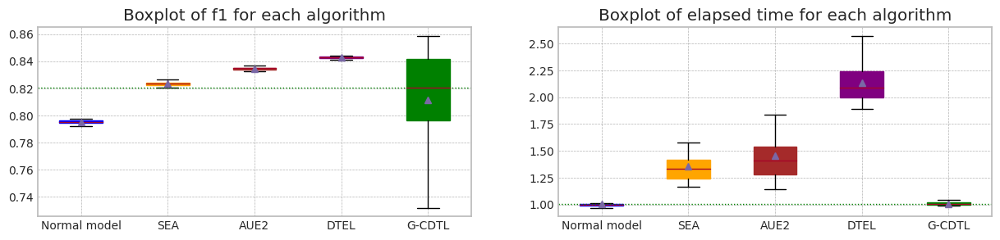

In [29]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,trial_count=20,weight_init=True) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [30]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [31]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [32]:
x1.shape

(40000, 5)

In [33]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [34]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


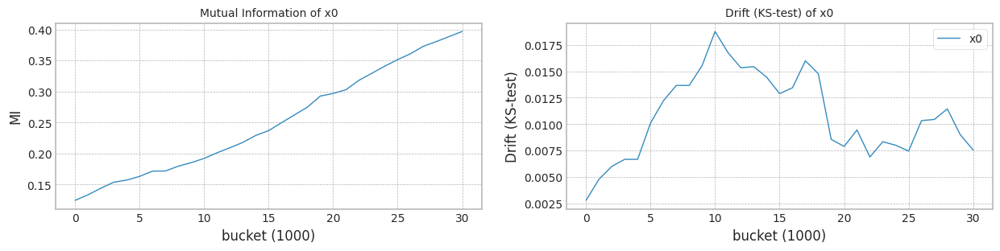

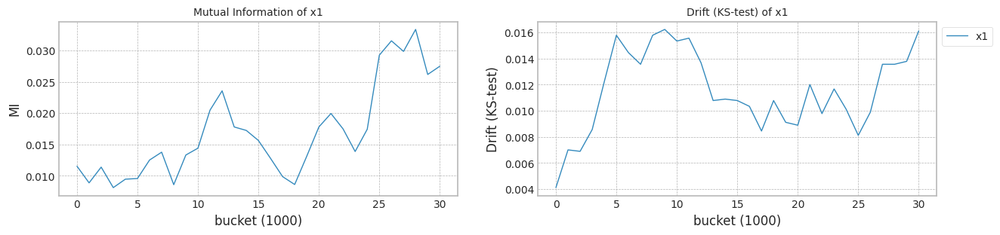

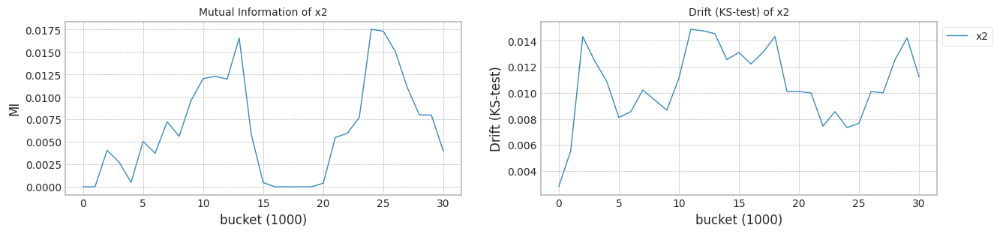

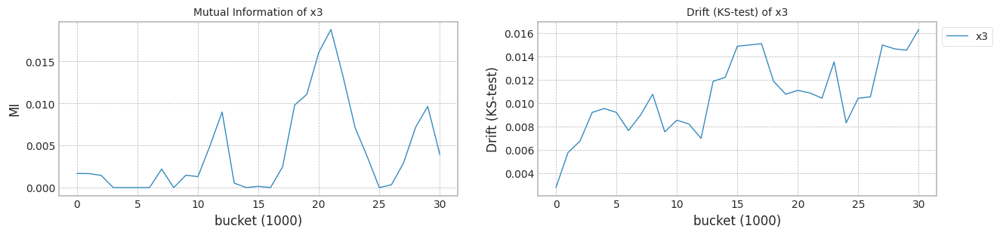

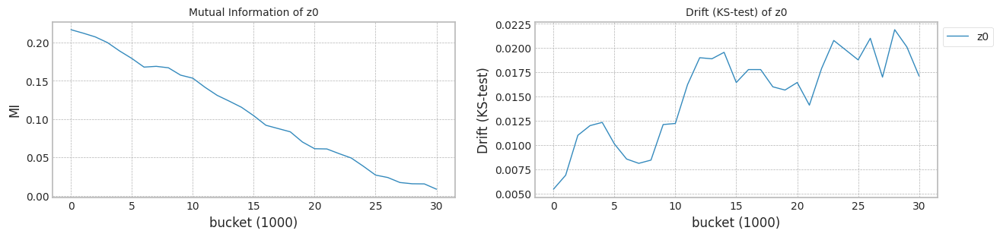

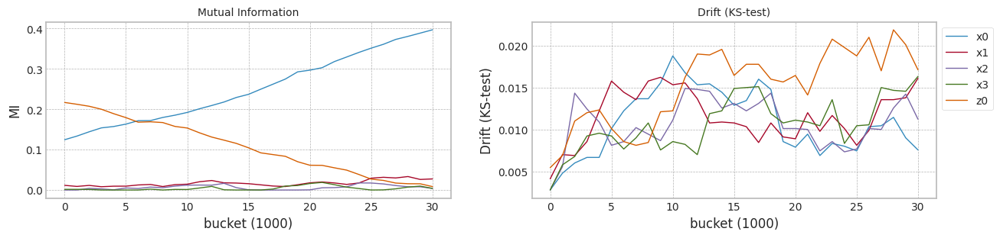

In [35]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [36]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.25it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988202553501561
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.22it/s]


Test f1 score: 0.9976260564048999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.232036
x1    0.104928
x2    0.184996
x3    0.224072
z0    0.179548
dtype: float64
Mean F1 for all data: 0.9345163446718425
Normal model median        : 0.8988202553501561
Drift tolerant model median: 0.9345163446718425
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 650.50it/s]


Test f1 score: 0.9908030719635916
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987669515565779
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.16it/s]


Test f1 score: 0.9977190648165748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.217989
x1    0.123004
x2    0.105369
x3    0.460470
z0    0.270222
dtype: float64
Mean F1 for all data: 0.9284954431231306
Normal model median        : 0.898793603453367
Drift tolerant model median: 0.9315058938974865
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.67it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987136933622942
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.56it/s]


Test f1 score: 0.9965746907706945
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.221151
x1    0.115996
x2    0.086308
x3    0.268563
z0    0.292416
dtype: float64
Mean F1 for all data: 0.9323334690542009
Normal model median        : 0.8987669515565779
Drift tolerant model median: 0.9323334690542009
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 647.07it/s]


Test f1 score: 0.9908987485779295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988293142204133
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.70it/s]


Test f1 score: 0.9966802617850707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.220885
x1    0.138781
x2    0.062645
x3    0.300470
z0    0.244699
dtype: float64
Mean F1 for all data: 0.9305717294952569
Normal model median        : 0.898793603453367
Drift tolerant model median: 0.9314525992747289
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 651.23it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987400615783205
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.60it/s]


Test f1 score: 0.997239935281241
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.174129
x1    0.113624
x2    0.080434
x3    0.404412
z0    0.364341
dtype: float64
Mean F1 for all data: 0.8952034682667281
Normal model median        : 0.8987669515565779
Drift tolerant model median: 0.9305717294952569
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 649.06it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987994818561682
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.19it/s]


Test f1 score: 0.9971439451637472
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.278380
x1    0.166111
x2    0.080129
x3    0.248100
z0    0.346885
dtype: float64
Mean F1 for all data: 0.9260359898598509
Normal model median        : 0.8987832167063731
Drift tolerant model median: 0.9295335863091938
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.94it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988878245106668
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.25it/s]


Test f1 score: 0.9972394098048548
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.209695
x1    0.131366
x2    0.109376
x3    0.328520
z0    0.265656
dtype: float64
Mean F1 for all data: 0.9325627170168308
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9305717294952569
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 643.37it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988213007984267
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.92it/s]


Test f1 score: 0.99743028457219
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.190244
x1    0.188652
x2    0.314935
x3    0.082771
z0    0.284423
dtype: float64
Mean F1 for all data: 0.9276457965178947
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9295335863091938
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.21it/s]


Test f1 score: 0.9898779680257307
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8984292366580808
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.00it/s]


Test f1 score: 0.9960881595267627
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.086846
x1    0.126427
x2    0.046394
x3    0.035753
z0    0.324667
dtype: float64
Mean F1 for all data: 0.9296529748740798
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9296529748740798
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 649.22it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988327463650373
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.78it/s]


Test f1 score: 0.9978163865945125
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.209387
x1    0.113885
x2    0.097315
x3    0.368133
z0    0.210849
dtype: float64
Mean F1 for all data: 0.940951040546754
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9301123521846684
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.46it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986968736271247
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.05it/s]


Test f1 score: 0.9976242516392664
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.185301
x1    0.114785
x2    0.088000
x3    0.428358
z0    0.248789
dtype: float64
Mean F1 for all data: 0.9285894025706668
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9296529748740798
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.90it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8990234238511553
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.47it/s]


Test f1 score: 0.9980043713769836
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.245760
x1    0.107631
x2    0.269459
x3    0.313462
z0    0.276534
dtype: float64
Mean F1 for all data: 0.9334829837742246
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9301123521846684
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 626.09it/s]


Test f1 score: 0.9906116642958748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986668611037882
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.79it/s]


Test f1 score: 0.9954207212364052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.222763
x1    0.119082
x2    0.257154
x3    0.213344
z0    0.235082
dtype: float64
Mean F1 for all data: 0.9256921221776273
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9296529748740798
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.06it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987932696808562
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.59it/s]


Test f1 score: 0.9985737377579159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.197065
x1    0.111280
x2    0.202136
x3    0.336254
z0    0.371652
dtype: float64
Mean F1 for all data: 0.9092783885351233
Normal model median        : 0.8987963757685122
Drift tolerant model median: 0.9291211887223734
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 616.62it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988501887807624
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.25it/s]


Test f1 score: 0.9980043713769836
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.190061
x1    0.110297
x2    0.087634
x3    0.399652
z0    0.160093
dtype: float64
Mean F1 for all data: 0.9316931168603354
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9296529748740798
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.79it/s]


Test f1 score: 0.9907073772046273
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987216888544928
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.87it/s]


Test f1 score: 0.9967692892436336
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.189753
x1    0.117337
x2    0.269305
x3    0.242401
z0    0.323753
dtype: float64
Mean F1 for all data: 0.9185681584029189
Normal model median        : 0.8987963757685122
Drift tolerant model median: 0.9291211887223734
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.64it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988491572169574
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.20it/s]


Test f1 score: 0.997148288973384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.198821
x1    0.118681
x2    0.105176
x3    0.349355
z0    0.307065
dtype: float64
Mean F1 for all data: 0.9313609164713019
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9296529748740798
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 647.69it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989191991438977
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.96it/s]


Test f1 score: 0.9971493728620296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.199082
x1    0.119846
x2    0.121806
x3    0.324290
z0    0.307570
dtype: float64
Mean F1 for all data: 0.929211995766546
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9294324853203129
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.07it/s]


Test f1 score: 0.9908987485779295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898862317782457
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.30it/s]


Test f1 score: 0.9970551914125582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.219703
x1    0.145341
x2    0.350029
x3    0.059061
z0    0.231896
dtype: float64
Mean F1 for all data: 0.9267306462210556
Normal model median        : 0.8988202553501561
Drift tolerant model median: 0.929211995766546
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.46it/s]


Test f1 score: 0.9904383224462748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988165407168062
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.03it/s]


Test f1 score: 0.9967625214244905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.205018
x1    0.112971
x2    0.105308
x3    0.313767
z0    0.361337
dtype: float64
Mean F1 for all data: 0.9268922292265129
Normal model median        : 0.8988183980334812
Drift tolerant model median: 0.9289006991686064
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9252397656276828
SEA median: 0.9252397656276828
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.55it/s]


Early stop at  2414.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.939868994357555
AUE median: 0.939868994357555
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513784905287072
DTEL median: 0.9513784905287072
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.19it/s]


Early stop at  3307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9404942807073582
SEA median: 0.9328670231675205
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


Early stop at  3368.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9394973096758861
AUE median: 0.9396831520167206
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515083882426643
DTEL median: 0.9514434393856857
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9254327627126568
SEA median: 0.9254327627126568
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3440.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9396593017759306
AUE median: 0.9396593017759306
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  3807.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9509171763579615
DTEL median: 0.9513784905287072
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.03it/s]


Early stop at  3552.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.936370618305238
SEA median: 0.9309016905089474
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.20it/s]


Early stop at  3015.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.939724438834846
AUE median: 0.9396918703053883
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.11it/s]


Early stop at  3400.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513428829660753
DTEL median: 0.9513606867473912
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9385641354181636
SEA median: 0.936370618305238
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  3698.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9398092410269299
AUE median: 0.939724438834846
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.22it/s]


Early stop at  2668.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512500009986373
DTEL median: 0.9513428829660753
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  3770.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9368401515513888
SEA median: 0.9366053849283134
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9399677483135356
AUE median: 0.9397668399308879
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515437585296943
DTEL median: 0.9513606867473912
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.07it/s]


Early stop at  3455.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9220099663002768
SEA median: 0.936370618305238
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9401071823554149
AUE median: 0.9398092410269299
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515237574047232
DTEL median: 0.9513784905287072
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9251035894971043
SEA median: 0.9309016905089474
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9395427743256006
AUE median: 0.9397668399308879
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9516092289253483
DTEL median: 0.9514434393856857
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9403994921637767
SEA median: 0.936370618305238
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3434.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9397556651702742
AUE median: 0.9397556651702742
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9511729609794953
DTEL median: 0.9513784905287072
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9417186656049266
SEA median: 0.9366053849283134
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  3702.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9397665983778837
AUE median: 0.9397611317740789
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.15it/s]


Early stop at  3279.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514538800578992
DTEL median: 0.9514161852933032
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9381375038063915
SEA median: 0.9368401515513888
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.05it/s]


Early stop at  3479.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9398297276085472
AUE median: 0.9397665983778837
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.09it/s]


Early stop at  3454.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512927367539324
DTEL median: 0.9513784905287072
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  3796.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.936531320662238
SEA median: 0.9366857361068134
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9399065875428955
AUE median: 0.9397879197024068
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.99it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513346150561833
DTEL median: 0.9513606867473912
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.03it/s]


Early stop at  3424.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9358087327292337
SEA median: 0.936531320662238
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  3774.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9398675191496382
AUE median: 0.9398092410269299
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.98it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512373366159086
DTEL median: 0.9513428829660753
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.938647284939092
SEA median: 0.9366857361068134
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.05it/s]


Early stop at  3363.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.939975180856134
AUE median: 0.9398194843177385
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514117001721972
DTEL median: 0.9513606867473912
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9371627994801188
SEA median: 0.9368401515513888
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  3580.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9400350892356658
AUE median: 0.9398297276085472
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514293356163513
DTEL median: 0.9513784905287072
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  3801.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9368463656429057
SEA median: 0.9368432585971472
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.01it/s]


Early stop at  3580.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9395965860463316
AUE median: 0.9398194843177385
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515075201335431
DTEL median: 0.9513950953504522
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9383460346291111
SEA median: 0.9368463656429057
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.28it/s]


Early stop at  2923.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9396826938538593
AUE median: 0.9398092410269299
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  3809.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512112512154501
DTEL median: 0.9513784905287072
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9351061172432428
SEA median: 0.9368432585971472
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.02it/s]


Early stop at  3571.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9399060817278573
AUE median: 0.9398194843177385
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  3839.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514967448856003
DTEL median: 0.9513950953504522
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.83it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9353803979680427
SEA median: 0.9368401515513888
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.86it/s]


Early stop at  310.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8968253939740788
AUE median: 0.9398092410269299
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  3855.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9511654030343115
DTEL median: 0.9513784905287072
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9401894219537605
SEA median: 0.9368432585971472
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.32it/s]


Early stop at  2728.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9401646984914004
AUE median: 0.9398194843177385
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.14it/s]


Early stop at  3153.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9509987730693582
DTEL median: 0.9513606867473912


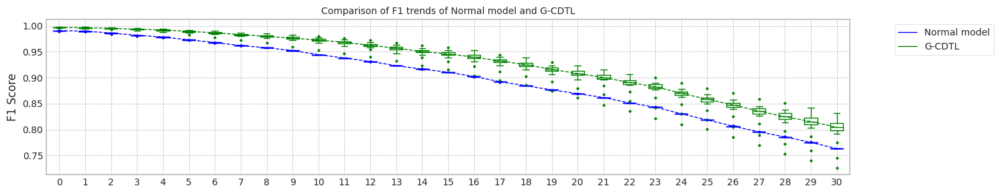

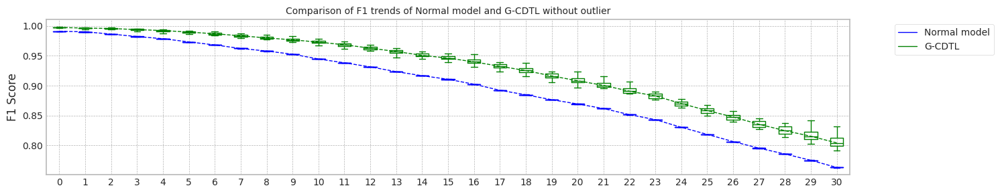

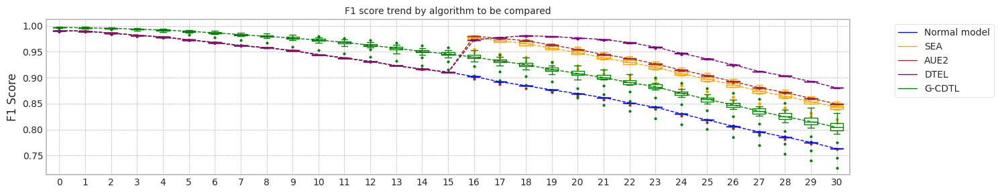

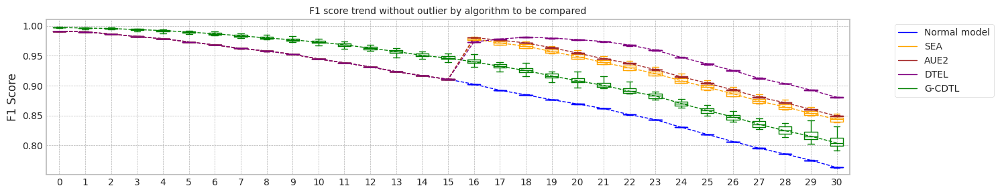

max_mean_trial= 9


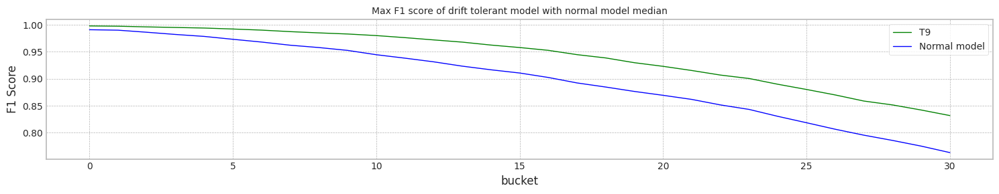

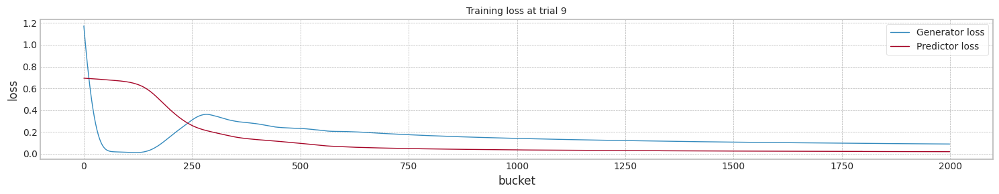

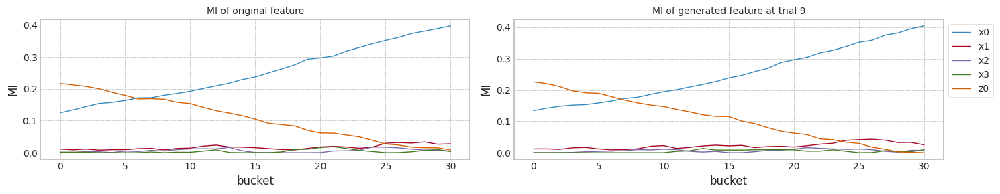

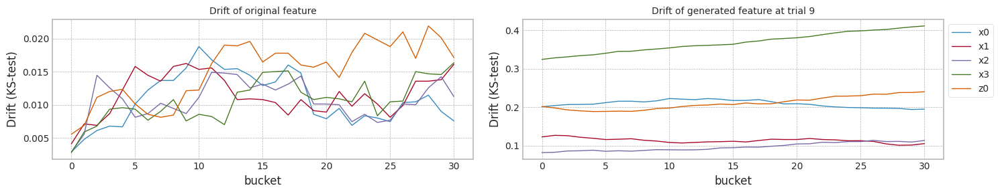

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.898820,0.763238,5.997851
1,1.0,0.990803,0.989886,0.898767,0.763078,5.891109
2,2.0,0.990897,0.989979,0.898714,0.763029,5.954629
3,3.0,0.990899,0.989981,0.898829,0.763238,5.960235
4,4.0,0.990897,0.989979,0.898740,0.763029,5.874830
5,5.0,0.990897,0.989979,0.898799,0.763238,5.901845
6,6.0,0.990801,0.989979,0.898888,0.763158,6.046114
7,7.0,0.990801,0.989979,0.898821,0.763108,6.190934
8,8.0,0.989878,0.988868,0.898429,0.763284,5.954538
9,9.0,0.990993,0.990075,0.898833,0.763238,5.969067


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.925240,0.820080,10.606848
1,1.0,0.990803,0.989886,0.940494,0.850452,9.764943
2,2.0,0.990897,0.989979,0.925433,0.819915,10.725456
3,3.0,0.990899,0.989981,0.936371,0.842140,10.277961
4,4.0,0.990897,0.989979,0.938564,0.847159,10.736206
5,5.0,0.990897,0.989979,0.936840,0.843421,10.556552
6,6.0,0.990801,0.989979,0.922010,0.812868,10.148112
7,7.0,0.990801,0.989979,0.925104,0.819548,10.673271
8,8.0,0.989878,0.988868,0.940399,0.850843,10.606406
9,9.0,0.990993,0.990075,0.941719,0.853584,10.814272


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.939869,0.849529,8.778615
1,1.0,0.990803,0.989886,0.939497,0.848799,9.856936
2,2.0,0.990897,0.989979,0.939659,0.849042,10.093898
3,3.0,0.990899,0.989981,0.939724,0.849627,9.723907
4,4.0,0.990897,0.989979,0.939809,0.849285,10.514366
5,5.0,0.990897,0.989979,0.939968,0.849870,10.854796
6,6.0,0.990801,0.989979,0.940107,0.849561,10.669001
7,7.0,0.990801,0.989979,0.939543,0.848544,10.808719
8,8.0,0.989878,0.988868,0.939756,0.849995,10.103395
9,9.0,0.990993,0.990075,0.939767,0.849134,10.603468


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.951378,0.880124,15.324940
1,1.0,0.990803,0.989886,0.951508,0.881026,15.281143
2,2.0,0.990897,0.989979,0.950917,0.879965,15.213375
3,3.0,0.990899,0.989981,0.951343,0.880760,14.729606
4,4.0,0.990897,0.989979,0.951250,0.880566,13.995122
5,5.0,0.990897,0.989979,0.951544,0.880910,15.808742
6,6.0,0.990801,0.989979,0.951524,0.880716,15.532419
7,7.0,0.990801,0.989979,0.951609,0.880910,15.422787
8,8.0,0.989878,0.988868,0.951173,0.880742,15.443673
9,9.0,0.990993,0.990075,0.951454,0.880689,14.478559


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.997626,0.996964,0.934516,0.813003,5.974974
1,1.0,0.997719,0.996581,0.928495,0.802645,5.938597
2,2.0,0.996575,0.995530,0.932333,0.812337,5.961555
3,3.0,0.996680,0.996020,0.930572,0.804495,6.018559
4,4.0,0.997240,0.995813,0.895203,0.726452,5.955860
5,5.0,0.997144,0.995716,0.926036,0.791342,5.984667
6,6.0,0.997239,0.996195,0.932563,0.812786,6.028672
7,7.0,0.997430,0.996481,0.927646,0.796663,5.944683
8,8.0,0.996088,0.995233,0.929653,0.800149,6.024594
9,9.0,0.997816,0.997344,0.940951,0.831824,5.996075


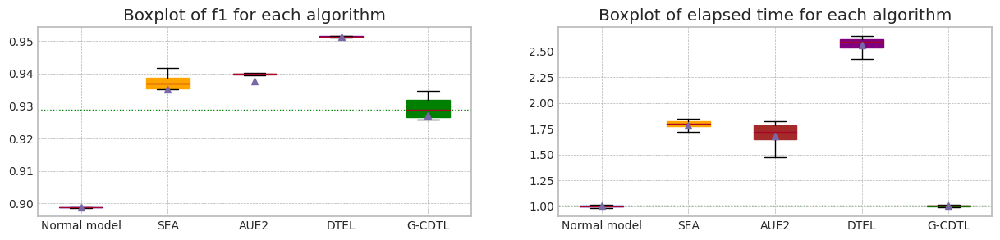

In [37]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,trial_count=20,weight_init=True) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [38]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 1.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [39]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.563076837122426


19931

### 실험

MI Analysis MI Max 0.21053, Min 0.00413, Mean 0.06759, Std 0.07940
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


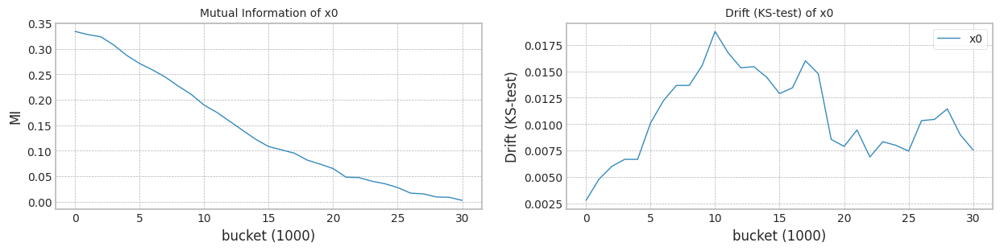

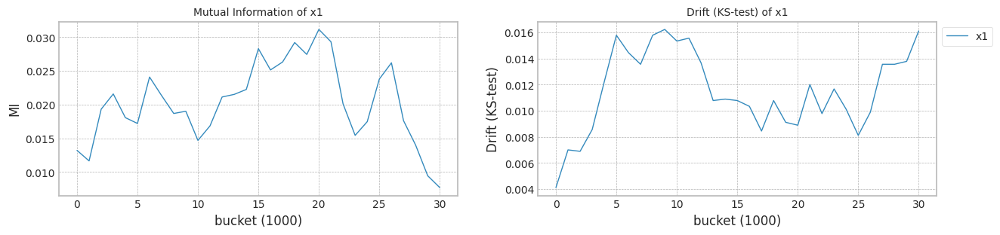

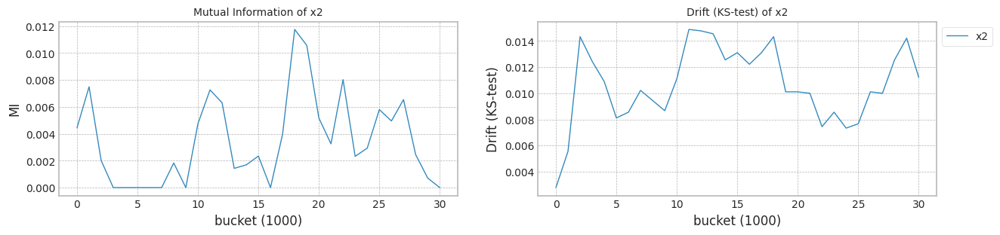

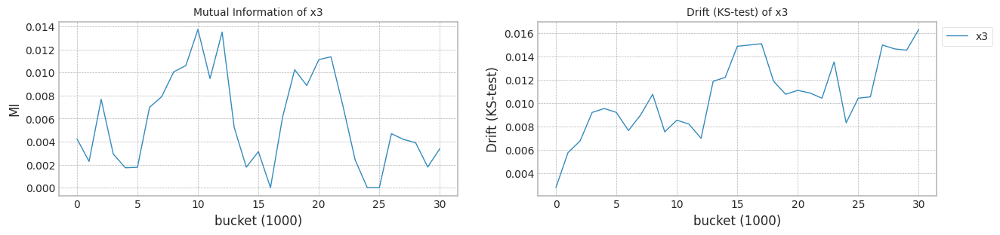

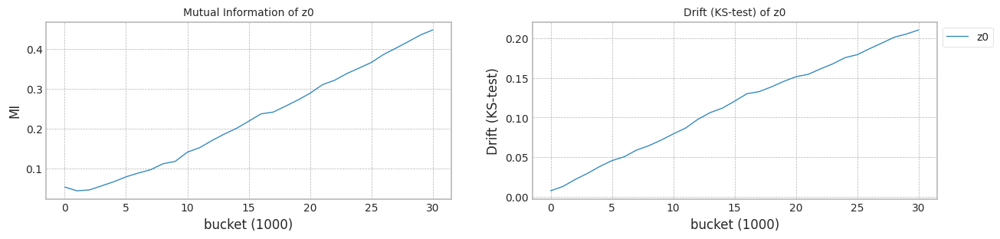

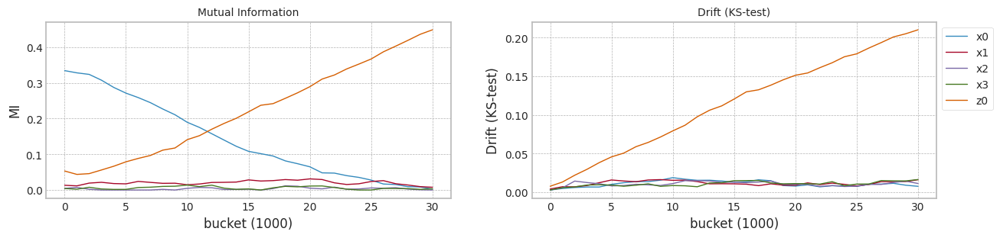

In [40]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [41]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.31it/s]


Test f1 score: 0.9519077901430842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.91it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750746374947543
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.96it/s]


Test f1 score: 0.9526926509967271
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.295004
x1    0.097029
x2    0.311864
x3    0.334556
z0    0.199541
dtype: float64
Mean F1 for all data: 0.8960337449718302
Normal model median        : 0.8750746374947543
Drift tolerant model median: 0.8960337449718302
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.74it/s]


Test f1 score: 0.9518791012129647
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750606404835807
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.61it/s]


Test f1 score: 0.9539165920175177
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.205409
x1    0.125828
x2    0.076412
x3    0.435165
z0    0.188176
dtype: float64
Mean F1 for all data: 0.8995015333370223
Normal model median        : 0.8750676389891675
Drift tolerant model median: 0.8977676391544263
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.86it/s]


Test f1 score: 0.9521250124415249
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8754527777114245
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.01it/s]


Test f1 score: 0.9541703946714384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.136842
x1    0.050717
x2    0.228495
x3    0.415692
z0    0.181151
dtype: float64
Mean F1 for all data: 0.9031135333848428
Normal model median        : 0.8750746374947543
Drift tolerant model median: 0.8995015333370223
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.44it/s]


Test f1 score: 0.9520969986086265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749873060869433
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.82it/s]


Test f1 score: 0.9529118964659035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.179548
x1    0.035366
x2    0.071943
x3    0.374219
z0    0.173502
dtype: float64
Mean F1 for all data: 0.9066388024615758
Normal model median        : 0.8750676389891675
Drift tolerant model median: 0.9013075333609326
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 653.38it/s]


Test f1 score: 0.9512996713474753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8753523327493513
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.08it/s]


Test f1 score: 0.9533699450823764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.162211
x1    0.136814
x2    0.137778
x3    0.052677
z0    0.083247
dtype: float64
Mean F1 for all data: 0.900876898111302
Normal model median        : 0.8750746374947543
Drift tolerant model median: 0.900876898111302
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.58it/s]


Test f1 score: 0.9506860210777491
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8746570683750957
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.95it/s]


Test f1 score: 0.9534071635238951
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.209075
x1    0.070875
x2    0.026211
x3    0.400280
z0    0.169932
dtype: float64
Mean F1 for all data: 0.8982975514465142
Normal model median        : 0.8750676389891675
Drift tolerant model median: 0.9001892157241622
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.44it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750706306772311
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.44it/s]


Test f1 score: 0.9528481329462408
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.188606
x1    0.051401
x2    0.037108
x3    0.415982
z0    0.190871
dtype: float64
Mean F1 for all data: 0.9054073432738321
Normal model median        : 0.8750706306772311
Drift tolerant model median: 0.900876898111302
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.55it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750792239661375
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.94it/s]


Test f1 score: 0.9541703946714384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.207437
x1    0.076176
x2    0.310011
x3    0.139061
z0    0.164588
dtype: float64
Mean F1 for all data: 0.9060579674750584
Normal model median        : 0.8750726340859927
Drift tolerant model median: 0.9019952157480724
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 616.56it/s]


Test f1 score: 0.9516352824578791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8744643562993428
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.31it/s]


Test f1 score: 0.9527040510876071
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.087384
x1    0.116176
x2    0.078111
x3    0.130172
z0    0.161376
dtype: float64
Mean F1 for all data: 0.8985532775342201
Normal model median        : 0.8750706306772311
Drift tolerant model median: 0.900876898111302
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 620.83it/s]


Test f1 score: 0.951803637086356
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750053454501086
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.86it/s]


Test f1 score: 0.955288985823337
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.122749
x1    0.119685
x2    0.278154
x3    0.378624
z0    0.157391
dtype: float64
Mean F1 for all data: 0.9032107655757096
Normal model median        : 0.8750656355804058
Drift tolerant model median: 0.9019952157480724
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.92it/s]


Test f1 score: 0.951803637086356
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8753922250913783
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.81it/s]


Test f1 score: 0.9533379763207641
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.249337
x1    0.066380
x2    0.087624
x3    0.413423
z0    0.178219
dtype: float64
Mean F1 for all data: 0.8982208426086029
Normal model median        : 0.8750706306772311
Drift tolerant model median: 0.900876898111302
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.59it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750563113790598
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.69it/s]


Test f1 score: 0.9533399800598207
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.142663
x1    0.074237
x2    0.311566
x3    0.203437
z0    0.184229
dtype: float64
Mean F1 for all data: 0.9073245371309483
Normal model median        : 0.8750656355804058
Drift tolerant model median: 0.9019952157480724
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.70it/s]


Test f1 score: 0.9518982309679984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749585116945194
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.60it/s]


Test f1 score: 0.9530161258212225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.168434
x1    0.121659
x2    0.285989
x3    0.090645
z0    0.172294
dtype: float64
Mean F1 for all data: 0.8977249164349863
Normal model median        : 0.8750606404835807
Drift tolerant model median: 0.900876898111302
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.37it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750450861024706
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.95it/s]


Test f1 score: 0.9518684603886397
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.278143
x1    0.208491
x2    0.263552
x3    0.342197
z0    0.209545
dtype: float64
Mean F1 for all data: 0.8921319962894121
Normal model median        : 0.8750584759313202
Drift tolerant model median: 0.9001892157241622
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 657.32it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750563113790598
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.01it/s]


Test f1 score: 0.9536133784590882
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.095875
x1    0.096179
x2    0.087086
x3    0.520423
z0    0.177839
dtype: float64
Mean F1 for all data: 0.9018247283302688
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.900876898111302
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.95it/s]


Test f1 score: 0.9522483087942698
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8752681071082099
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.35it/s]


Test f1 score: 0.9531389911451597
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.297552
x1    0.103391
x2    0.277097
x3    0.425233
z0    0.198477
dtype: float64
Mean F1 for all data: 0.8985233086345885
Normal model median        : 0.8750584759313202
Drift tolerant model median: 0.9001892157241622
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.02it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750517609799601
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.58it/s]


Test f1 score: 0.952722920406942
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.143860
x1    0.076057
x2    0.090355
x3    0.402756
z0    0.172168
dtype: float64
Mean F1 for all data: 0.9005074738089313
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9005074738089313
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.00it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750067132603533
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.48it/s]


Test f1 score: 0.95424317617866
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.152215
x1    0.067724
x2    0.047538
x3    0.017742
z0    0.188581
dtype: float64
Mean F1 for all data: 0.9055078638361613
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9006921859601167
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.97it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8751830643573535
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.94it/s]


Test f1 score: 0.9524665468344319
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.113570
x1    0.082513
x2    0.341634
x3    0.045100
z0    0.164885
dtype: float64
Mean F1 for all data: 0.9016617627479849
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.900876898111302
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 656.50it/s]


Test f1 score: 0.9516352824578791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8744679434605347
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.26it/s]


Test f1 score: 0.9532524368410582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.156280
x1    0.149391
x2    0.029717
x3    0.363957
z0    0.200634
dtype: float64
Mean F1 for all data: 0.9034785044711907
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9012693304296435
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8945862871765763
SEA median: 0.8945862871765763
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.89it/s]


Early stop at  1696.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065456556771798
AUE median: 0.9065456556771798
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.49it/s]


Early stop at  1610.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212194814603115
DTEL median: 0.9212194814603115
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2020.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8969285672203376
SEA median: 0.895757427198457
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.49it/s]


Early stop at  2450.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065849500808213
AUE median: 0.9065653028790006
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212249232570161
DTEL median: 0.9212222023586638
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.906160769839564
SEA median: 0.8969285672203376
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.03it/s]


Early stop at  1527.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9031948239463439
AUE median: 0.9065456556771798
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.39it/s]


Early stop at  1937.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209254092747508
DTEL median: 0.9212194814603115
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.90it/s]


Early stop at  1691.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8964374935110071
SEA median: 0.8966830303656723
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.96it/s]


Early stop at  1590.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067235379434788
AUE median: 0.9065653028790006
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.920905060437185
DTEL median: 0.9210724453675312
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.13it/s]


Early stop at  1354.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9055931850711624
SEA median: 0.8969285672203376
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.42it/s]


Early stop at  2667.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9033483233114616
AUE median: 0.9065456556771798
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.51it/s]


Early stop at  1367.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212594400354343
DTEL median: 0.9212194814603115
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.63it/s]


Early stop at  2228.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963759610028764
SEA median: 0.8966830303656723
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.90it/s]


Early stop at  1746.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9063992388207325
AUE median: 0.9064724472489561
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.63it/s]


Early stop at  1102.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9211963319733866
DTEL median: 0.921207906716849
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.53it/s]


Early stop at  2523.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8965419124207317
SEA median: 0.8965419124207317
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9061057498523147
AUE median: 0.9063992388207325
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  2018.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9208142326427972
DTEL median: 0.9211963319733866
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1865.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8973069143330773
SEA median: 0.8967352398205346
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9061735278988323
AUE median: 0.9062863833597824
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.61it/s]


Early stop at  1039.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212624962055496
DTEL median: 0.921207906716849
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.58it/s]


Early stop at  2197.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8995917640362893
SEA median: 0.8969285672203376
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.07it/s]


Early stop at  1454.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9061916508444395
AUE median: 0.9061916508444395
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  2160.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9205965130080715
DTEL median: 0.9211963319733866
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2098.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9062388420903668
SEA median: 0.8971177407767075
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2025.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9032167001280236
AUE median: 0.906182589371636
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9206215421549586
DTEL median: 0.9210608706240686
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8953675748367439
SEA median: 0.8969285672203376
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.75it/s]


Early stop at  1856.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9066931888759238
AUE median: 0.9061916508444395
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1511.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213036862487292
DTEL median: 0.9211963319733866
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  1892.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8966737980535294
SEA median: 0.8968011826369335
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.82it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.905903160474335
AUE median: 0.906182589371636
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1197.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214221076091117
DTEL median: 0.921207906716849
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.57it/s]


Early stop at  2220.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8966138179055653
SEA median: 0.8966737980535294
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.62it/s]


Early stop at  2101.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9063063926673588
AUE median: 0.9061916508444395
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.09it/s]


Early stop at  3293.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210498416469203
DTEL median: 0.9211963319733866
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1861.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8972452282042742
SEA median: 0.8968011826369335
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1776.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065485270031375
AUE median: 0.9062490217558992
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3322.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210402544924554
DTEL median: 0.9211230868101534
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.74it/s]


Early stop at  1933.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8965181503237442
SEA median: 0.8966737980535294
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.75it/s]


Early stop at  1854.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9069325591397506
AUE median: 0.9063063926673588
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210548843477881
DTEL median: 0.9210548843477881
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.52it/s]


Early stop at  2260.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9058578860400752
SEA median: 0.8968011826369335
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9021817262906546
AUE median: 0.9062490217558992
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


Early stop at  3230.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9198640558948229
DTEL median: 0.9210523629973542
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1474.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8970810692969898
SEA median: 0.8969285672203376
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.66it/s]


Early stop at  1988.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9064015185851199
AUE median: 0.9063063926673588
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.38it/s]


Early stop at  1679.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209894284842522
DTEL median: 0.9210498416469203
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.35it/s]


Early stop at  2649.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8966389888148283
SEA median: 0.8968011826369335
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.48it/s]


Early stop at  2257.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067459379918191
AUE median: 0.9063528157440457
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.28it/s]


Early stop at  2307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9216316561743615
DTEL median: 0.9210523629973542
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.77it/s]


Early stop at  1720.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8974883893338607
SEA median: 0.8969285672203376
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


Early stop at  45.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8710108151764
AUE median: 0.9063063926673588
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2108.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9208690323980673
DTEL median: 0.9210498416469203
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1384.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.898821235740711
SEA median: 0.8970048182586637
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.58it/s]


Early stop at  2113.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9060533329579801
AUE median: 0.9062490217558992
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9198396863694175
DTEL median: 0.9210450480696879


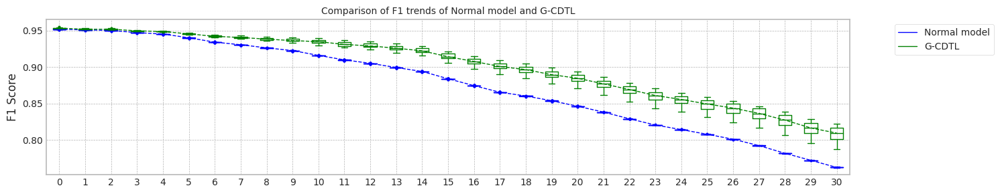

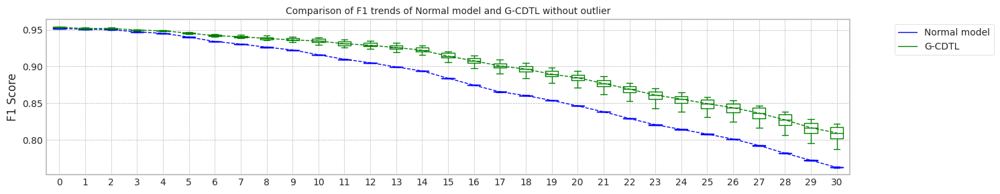

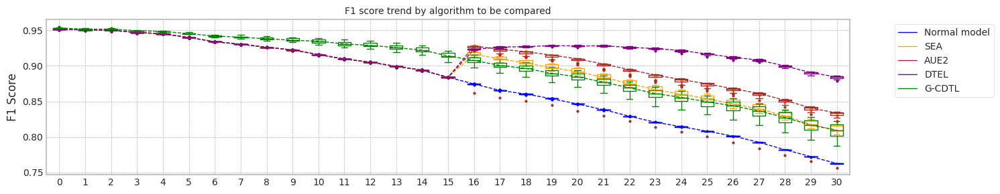

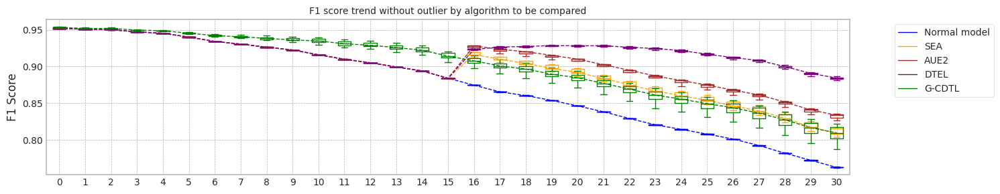

max_mean_trial= 11


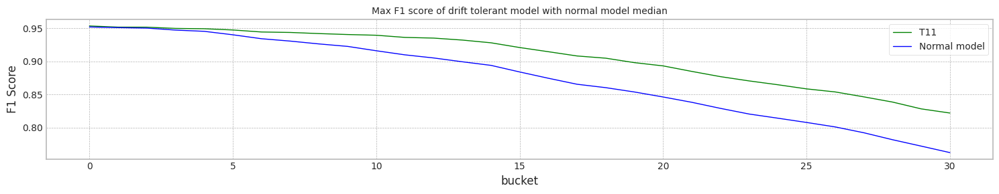

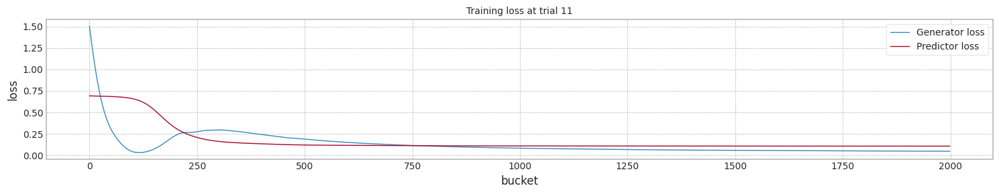

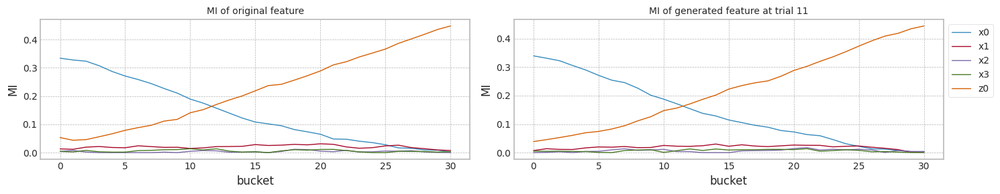

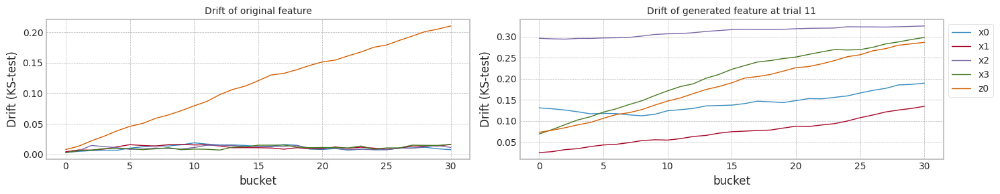

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.875075,0.762278,6.356967
1,1.0,0.951879,0.951018,0.875061,0.762534,6.049263
2,2.0,0.952125,0.951358,0.875453,0.763164,6.047661
3,3.0,0.952097,0.951236,0.874987,0.762139,6.100313
4,4.0,0.951300,0.950741,0.875352,0.762984,5.974247
5,5.0,0.950686,0.949940,0.874657,0.762981,5.967693
6,6.0,0.951813,0.950859,0.875071,0.762363,5.989047
7,7.0,0.951813,0.950859,0.875079,0.762278,5.991484
8,8.0,0.951635,0.950862,0.874464,0.762564,5.973734
9,9.0,0.951804,0.950745,0.875005,0.762854,5.978202


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.894586,0.803419,10.605162
1,1.0,0.951879,0.951018,0.896929,0.809327,8.346850
2,2.0,0.952125,0.951358,0.906161,0.831817,10.666295
3,3.0,0.952097,0.951236,0.896437,0.808545,7.990045
4,4.0,0.951300,0.950741,0.905593,0.829331,7.545745
5,5.0,0.950686,0.949940,0.896376,0.808955,8.590183
6,6.0,0.951813,0.950859,0.896542,0.808496,8.817064
7,7.0,0.951813,0.950859,0.897307,0.809879,8.161569
8,8.0,0.951635,0.950862,0.899592,0.817507,8.699707
9,9.0,0.951804,0.950745,0.906239,0.832367,8.352699


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.906546,0.833871,8.005912
1,1.0,0.951879,0.951018,0.906585,0.833890,8.930352
2,2.0,0.952125,0.951358,0.903195,0.826807,7.732887
3,3.0,0.952097,0.951236,0.906724,0.834658,7.867044
4,4.0,0.951300,0.950741,0.903348,0.826886,9.111234
5,5.0,0.950686,0.949940,0.906399,0.834985,8.003003
6,6.0,0.951813,0.950859,0.906106,0.831665,10.767792
7,7.0,0.951813,0.950859,0.906174,0.832124,10.803472
8,8.0,0.951635,0.950862,0.906192,0.833640,7.662314
9,9.0,0.951804,0.950745,0.903217,0.826514,8.402489


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.921219,0.884870,12.513719
1,1.0,0.951879,0.951018,0.921225,0.885594,15.302289
2,2.0,0.952125,0.951358,0.920925,0.881950,13.009907
3,3.0,0.952097,0.951236,0.920905,0.884922,15.355217
4,4.0,0.951300,0.950741,0.921259,0.883067,12.377108
5,5.0,0.950686,0.949940,0.921196,0.885060,11.809303
6,6.0,0.951813,0.950859,0.920814,0.882829,13.144997
7,7.0,0.951813,0.950859,0.921262,0.886235,11.921035
8,8.0,0.951635,0.950862,0.920597,0.884824,13.142326
9,9.0,0.951804,0.950745,0.920622,0.881527,15.460249


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.952693,0.951018,0.896034,0.795598,6.120237
1,1.0,0.953917,0.952666,0.899502,0.803897,6.125077
2,2.0,0.954170,0.952703,0.903114,0.814823,6.066390
3,3.0,0.952912,0.951849,0.906639,0.818491,5.980251
4,4.0,0.953370,0.951705,0.900877,0.802060,5.981293
5,5.0,0.953407,0.952143,0.898298,0.800391,5.962021
6,6.0,0.952848,0.950787,0.905407,0.814880,6.036149
7,7.0,0.954170,0.952599,0.906058,0.817103,5.985210
8,8.0,0.952704,0.951602,0.898553,0.808252,6.187162
9,9.0,0.955289,0.953535,0.903211,0.817484,6.058945


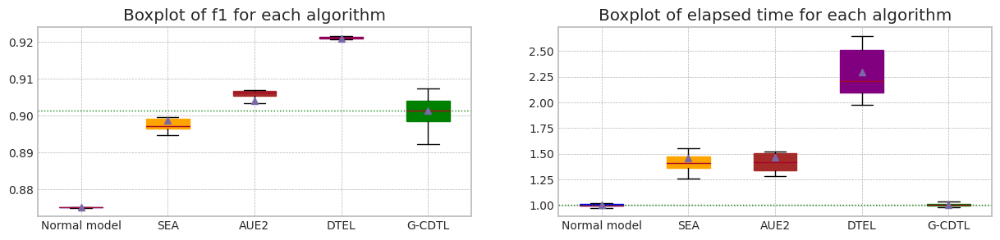

In [42]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,trial_count=20,weight_init=True) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [43]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


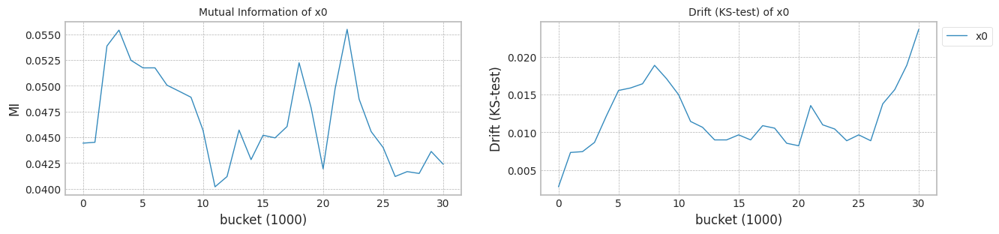

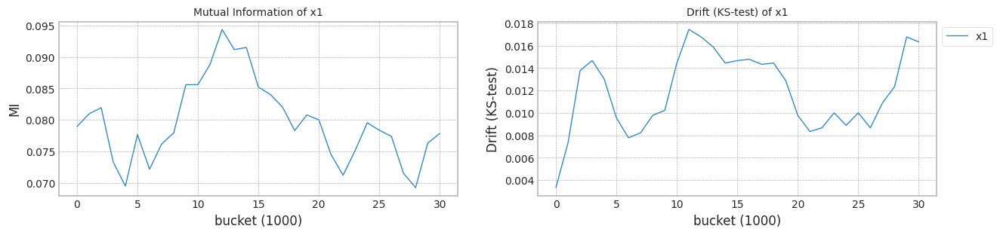

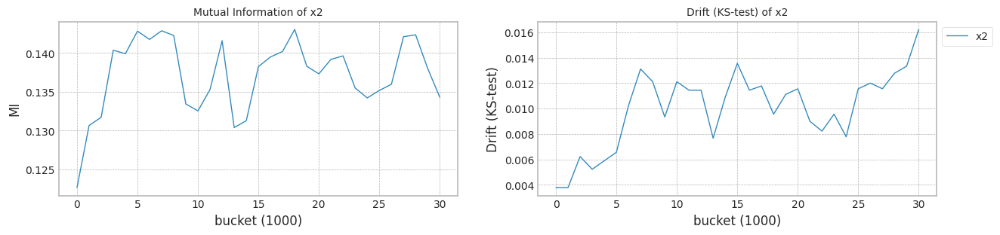

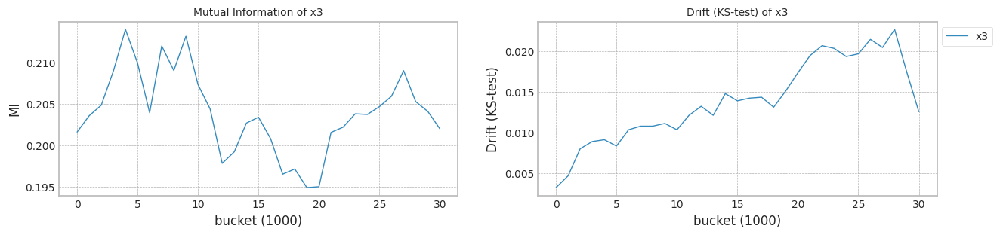

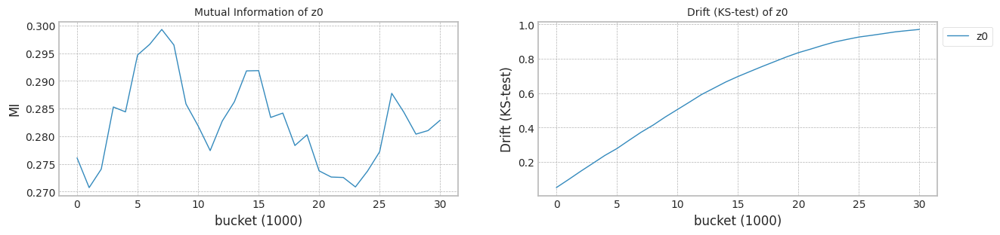

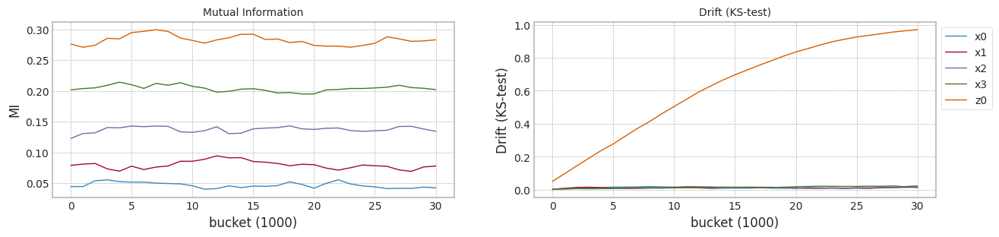

In [44]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [45]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 616.06it/s]


Test f1 score: 0.9124214177324951
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7697506691980245
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.30it/s]


Test f1 score: 0.920774647887324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.062179
x1    0.112355
x2    0.461584
x3    0.183860
z0    0.428717
dtype: float64
Mean F1 for all data: 0.9243038971267744
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9243038971267744
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 626.59it/s]


Test f1 score: 0.9116945107398569
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769608074571154
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.43it/s]


Test f1 score: 0.9217026907807676
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.464860
x1    0.470222
x2    0.183993
x3    0.182982
z0    0.563297
dtype: float64
Mean F1 for all data: 0.9245106508212891
Normal model median        : 0.7696793718845892
Drift tolerant model median: 0.9244072739740318
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.25it/s]


Test f1 score: 0.9116147923218739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7695735712097388
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.83it/s]


Test f1 score: 0.9218750000000001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.180735
x1    0.463125
x2    0.296065
x3    0.225484
z0    0.534362
dtype: float64
Mean F1 for all data: 0.8998330225370322
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9243038971267744
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.11it/s]


Test f1 score: 0.9120295042846297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7698832530161176
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.36it/s]


Test f1 score: 0.9208983294612236
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.274441
x1    0.476591
x2    0.242530
x3    0.046817
z0    0.453584
dtype: float64
Mean F1 for all data: 0.9248796969480628
Normal model median        : 0.7696793718845892
Drift tolerant model median: 0.9244072739740318
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.55it/s]


Test f1 score: 0.9122199372226432
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.86it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.768067119369189
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.91it/s]


Test f1 score: 0.9212121212121213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.06it/s]


mean of drift:
x0    0.203760
x1    0.342226
x2    0.108835
x3    0.119441
z0    0.208710
dtype: float64
Mean F1 for all data: 0.9248603184834319
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9245106508212891
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 620.56it/s]


Test f1 score: 0.9118699186991871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.06it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769468251390254
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.65it/s]


Test f1 score: 0.9219110378912684
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.122004
x1    0.506075
x2    0.122502
x3    0.162907
z0    0.439039
dtype: float64
Mean F1 for all data: 0.9245109245765701
Normal model median        : 0.7695908228904464
Drift tolerant model median: 0.9245107876989296
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 612.46it/s]


Test f1 score: 0.9114391143911439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703454451004218
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.14it/s]


Test f1 score: 0.9217563552327501
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.482226
x1    0.297935
x2    0.240778
x3    0.187233
z0    0.490086
dtype: float64
Mean F1 for all data: 0.8909939280271771
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9245106508212891
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 611.36it/s]


Test f1 score: 0.9117519514310496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7696256421241688
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.48it/s]


Test f1 score: 0.9208822561176342
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.081237
x1    0.285226
x2    0.405011
x3    0.135487
z0    0.425606
dtype: float64
Mean F1 for all data: 0.9253045465665957
Normal model median        : 0.7696168583476615
Drift tolerant model median: 0.9245107876989296
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 611.45it/s]


Test f1 score: 0.911790203727785
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7700464471743145
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.66it/s]


Test f1 score: 0.9218370501214396
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.514441
x1    0.232151
x2    0.245878
x3    0.073756
z0    0.412197
dtype: float64
Mean F1 for all data: 0.9251099422950134
Normal model median        : 0.7696256421241688
Drift tolerant model median: 0.9245109245765701
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.57it/s]


Test f1 score: 0.9115572436245252
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7702715163160048
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.74it/s]


Test f1 score: 0.9213259668508288
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.438323
x1    0.372301
x2    0.136301
x3    0.222398
z0    0.473545
dtype: float64
Mean F1 for all data: 0.9249384448962041
Normal model median        : 0.7696881556610966
Drift tolerant model median: 0.924685621530001
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.58it/s]


Test f1 score: 0.9116914075197745
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7699092431685476
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.04it/s]


Test f1 score: 0.9214971844981783
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.560272
x1    0.048789
x2    0.197194
x3    0.145885
z0    0.477839
dtype: float64
Mean F1 for all data: 0.924715990053838
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.924715990053838
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.80it/s]


Test f1 score: 0.9116753472222222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.770284023873014
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.73it/s]


Test f1 score: 0.9212415773776649
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.418154
x1    0.191000
x2    0.423652
x3    0.123789
z0    0.415480
dtype: float64
Mean F1 for all data: 0.910738695042785
Normal model median        : 0.7698169611070711
Drift tolerant model median: 0.9246134573152041
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 646.90it/s]


Test f1 score: 0.9112990674474083
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7684139055167575
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.29it/s]


Test f1 score: 0.9217735724502145
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.307315
x1    0.198620
x2    0.459548
x3    0.235713
z0    0.518943
dtype: float64
Mean F1 for all data: 0.8902608965203754
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9245109245765701
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 653.92it/s]


Test f1 score: 0.9117136659436008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7696312908047219
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.16it/s]


Test f1 score: 0.9213013849197625
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.316742
x1    0.457986
x2    0.345638
x3    0.170079
z0    0.474004
dtype: float64
Mean F1 for all data: 0.9233083487511389
Normal model median        : 0.7696909800013731
Drift tolerant model median: 0.9245107876989296
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 653.98it/s]


Test f1 score: 0.9117551286225986
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7706551438132474
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.87it/s]


Test f1 score: 0.9208965062623599
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.262738
x1    0.301849
x2    0.226129
x3    0.269595
z0    0.406591
dtype: float64
Mean F1 for all data: 0.9242355620390581
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9245106508212891
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 648.30it/s]


Test f1 score: 0.9121856027753685
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769554252062509
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.75it/s]


Test f1 score: 0.9222832052689351
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.574814
x1    0.243495
x2    0.127423
x3    0.228781
z0    0.530663
dtype: float64
Mean F1 for all data: 0.9250056457880338
Normal model median        : 0.7696909800013731
Drift tolerant model median: 0.9245107876989296
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.69it/s]


Test f1 score: 0.9116753472222222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703145744552067
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.49it/s]


Test f1 score: 0.9217563552327501
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.161631
x1    0.476319
x2    0.275792
x3    0.089211
z0    0.438108
dtype: float64
Mean F1 for all data: 0.9250219018854915
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9245109245765701
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.80it/s]


Test f1 score: 0.9117934251925789
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703452790082781
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.21it/s]


Test f1 score: 0.9205048715677591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.232925
x1    0.472810
x2    0.127358
x3    0.197412
z0    0.481183
dtype: float64
Mean F1 for all data: 0.9220375772829371
Normal model median        : 0.7698169611070711
Drift tolerant model median: 0.9245107876989296
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 646.83it/s]


Test f1 score: 0.9120867208672085
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7699449858432589
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.30it/s]


Test f1 score: 0.9218732782369146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.625412
x1    0.330556
x2    0.271746
x3    0.235871
z0    0.487323
dtype: float64
Mean F1 for all data: 0.9048689437635137
Normal model median        : 0.7698832530161176
Drift tolerant model median: 0.9245106508212891
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.64it/s]


Test f1 score: 0.9119081157221802
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7704449257400785
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.55it/s]


Test f1 score: 0.9219951658976049
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.386746
x1    0.337229
x2    0.294918
x3    0.322251
z0    0.511824
dtype: float64
Mean F1 for all data: 0.9230054182419501
Normal model median        : 0.7698962480923326
Drift tolerant model median: 0.9244072739740318
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1795.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8115228405438047
SEA median: 0.8115228405438047
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.05it/s]


Early stop at  1474.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.830245267430685
AUE median: 0.830245267430685
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


Early stop at  1373.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584953740291217
DTEL median: 0.8584953740291217
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.63it/s]


Early stop at  2216.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8100482642519578
SEA median: 0.8107855523978813
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1860.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8306014837387211
AUE median: 0.830423375584703
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3382.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8579107945026261
DTEL median: 0.8582030842658739
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.55it/s]


Early stop at  2381.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7977888262250381
SEA median: 0.8100482642519578
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.49it/s]


Early stop at  2441.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8301364083983597
AUE median: 0.830245267430685
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1459.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8577954509695822
DTEL median: 0.8579107945026261
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.16it/s]


Early stop at  1319.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8101261113159611
SEA median: 0.8100871877839595
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.15it/s]


Early stop at  1433.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8307748313075448
AUE median: 0.830423375584703
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.15it/s]


Early stop at  3352.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584329003149563
DTEL median: 0.8581718474087912
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.27it/s]


Early stop at  1172.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8259858198487471
SEA median: 0.8101261113159611
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  2007.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8252905922167224
AUE median: 0.830245267430685
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.41it/s]


Early stop at  1692.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8565181077432215
DTEL median: 0.8579107945026261
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.91it/s]


Early stop at  1698.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8106572052982278
SEA median: 0.8103916583070945
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1484.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8300868483223423
AUE median: 0.8301908379145224
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.41it/s]


Early stop at  1822.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8581793967644353
DTEL median: 0.8580450956335307
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.13it/s]


Early stop at  1180.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8116880536220518
SEA median: 0.8106572052982278
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.81it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8326795324973916
AUE median: 0.830245267430685
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.59it/s]


Early stop at  1144.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8586204561404449
DTEL median: 0.8581793967644353
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8074932764161659
SEA median: 0.8103916583070945
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8296017987395472
AUE median: 0.8301908379145224
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1417.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8574864141065538
DTEL median: 0.8580450956335307
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.69it/s]


Early stop at  2106.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8109905492022533
SEA median: 0.8106572052982278
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.92it/s]


Early stop at  1614.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308173823814176
AUE median: 0.830245267430685
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.39it/s]


Early stop at  1996.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584899749747555
DTEL median: 0.8581793967644353
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  2074.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.811578406931491
SEA median: 0.8108238772502405
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.12it/s]


Early stop at  1357.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8307441000748846
AUE median: 0.830423375584703
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3210.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8568489483256596
DTEL median: 0.8580450956335307
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.50it/s]


Early stop at  2577.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7995170383876176
SEA median: 0.8106572052982278
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.74it/s]


Early stop at  1894.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308885063077739
AUE median: 0.8306014837387211
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.24it/s]


Early stop at  2601.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583641564797264
DTEL median: 0.8581793967644353
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1739.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8103028208981816
SEA median: 0.8104800130982047
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8311148232380313
AUE median: 0.8306727919068029
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1557.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8585704898047931
DTEL median: 0.8582717766220809
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.90it/s]


Early stop at  1616.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8102179715879259
SEA median: 0.8103028208981816
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1806.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8299241835563645
AUE median: 0.8306014837387211
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.24it/s]


Early stop at  2418.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8557945030324103
DTEL median: 0.8581793967644353
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.31it/s]


Early stop at  1056.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.810325906564629
SEA median: 0.8103143637314053
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.88it/s]


Early stop at  1569.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8303185707146405
AUE median: 0.8304600272266809
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.39it/s]


Early stop at  1910.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8579791204894568
DTEL median: 0.8580792586269461
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.49it/s]


Early stop at  2362.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81220725712545
SEA median: 0.810325906564629
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.09it/s]


Early stop at  1289.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8317302175733358
AUE median: 0.8306014837387211
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1486.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8588529927624978
DTEL median: 0.8581793967644353
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.47it/s]


Early stop at  2486.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.810492830111973
SEA median: 0.810409368338301
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8309523864944188
AUE median: 0.8306727919068029
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.07it/s]


Early stop at  3577.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8587004389513043
DTEL median: 0.8582717766220809
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.75it/s]


Early stop at  1926.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81224762071862
SEA median: 0.810492830111973
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.26it/s]


Early stop at  1120.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8305974499100078
AUE median: 0.8306014837387211
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.56it/s]


Early stop at  1310.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8575966751146383
DTEL median: 0.8581793967644353
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


Early stop at  32.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7701546164803064
SEA median: 0.810409368338301
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.08it/s]


Early stop at  1172.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308262790337093
AUE median: 0.8306727919068029
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1478.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583967249809153
DTEL median: 0.8582717766220809
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.98it/s]


Early stop at  1530.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8136184168592548
SEA median: 0.810492830111973
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8293329617301545
AUE median: 0.8306014837387211
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.63it/s]


Early stop at  1009.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8573648001367092
DTEL median: 0.8581793967644353
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.90it/s]


Early stop at  1648.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81253645742414
SEA median: 0.8105750177051004
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1693.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8305554514266515
AUE median: 0.8305994668243645
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1602.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583750833650382
DTEL median: 0.8582717766220809


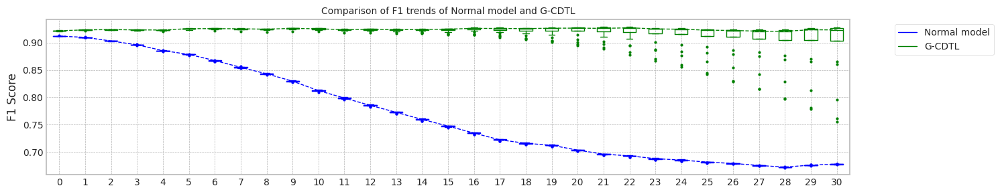

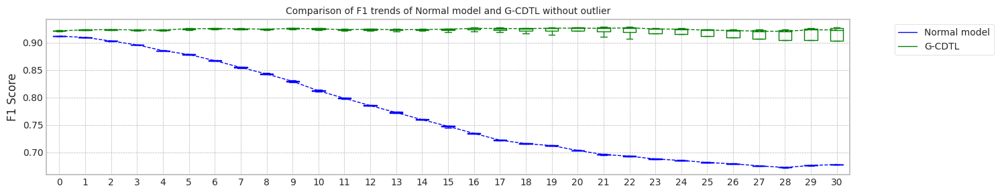

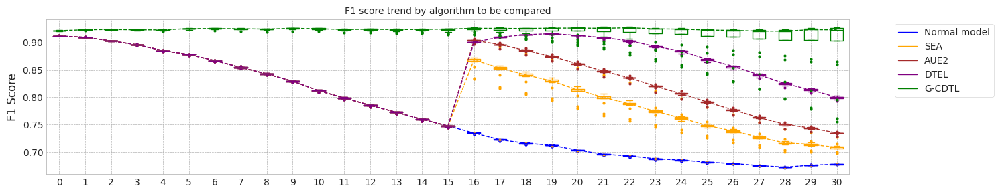

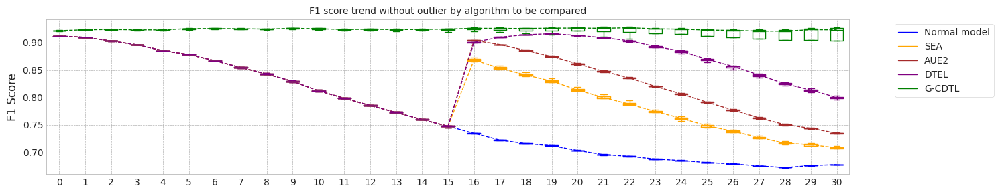

max_mean_trial= 7


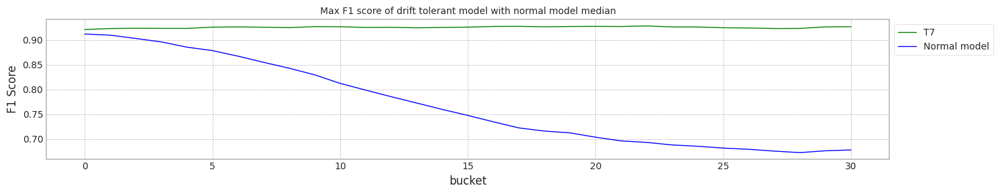

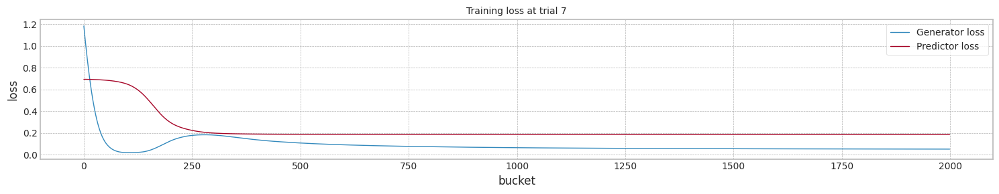

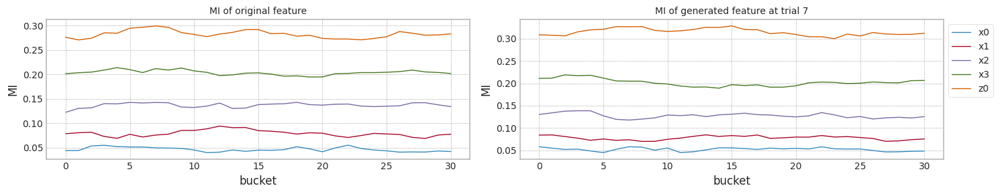

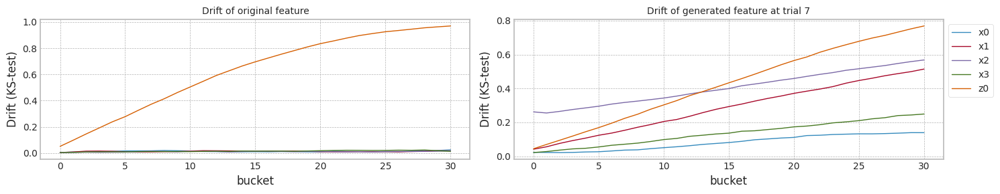

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.769751,0.677773,6.029711
1,1.0,0.911695,0.909460,0.769608,0.677522,6.104856
2,2.0,0.911615,0.909382,0.769574,0.677522,6.089545
3,3.0,0.912030,0.909674,0.769883,0.677672,6.174680
4,4.0,0.912220,0.909479,0.768067,0.676921,6.406349
5,5.0,0.911870,0.909557,0.769468,0.677572,6.143723
6,6.0,0.911439,0.909441,0.770345,0.677622,6.133127
7,7.0,0.911752,0.909402,0.769626,0.677723,6.080941
8,8.0,0.911790,0.909440,0.770046,0.677723,6.030924
9,9.0,0.911557,0.909557,0.770272,0.677773,6.011025


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.811523,0.709283,8.129981
1,1.0,0.911695,0.909460,0.810048,0.706491,8.568185
2,2.0,0.911615,0.909382,0.797789,0.697394,8.743377
3,3.0,0.912030,0.909674,0.810126,0.707474,7.475407
4,4.0,0.912220,0.909479,0.825986,0.726940,7.286251
5,5.0,0.911870,0.909557,0.810657,0.708459,7.959102
6,6.0,0.911439,0.909441,0.811688,0.708678,7.528982
7,7.0,0.911752,0.909402,0.807493,0.709292,10.700519
8,8.0,0.911790,0.909440,0.810991,0.708514,8.422045
9,9.0,0.911557,0.909557,0.811578,0.709612,8.445491


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.830245,0.734350,7.677786
1,1.0,0.911695,0.909460,0.830601,0.735058,8.102489
2,2.0,0.911615,0.909382,0.830136,0.734232,8.895215
3,3.0,0.912030,0.909674,0.830775,0.735058,7.491678
4,4.0,0.912220,0.909479,0.825291,0.728271,8.231618
5,5.0,0.911870,0.909557,0.830087,0.734291,8.115693
6,6.0,0.911439,0.909441,0.832680,0.737445,11.061345
7,7.0,0.911752,0.909402,0.829602,0.733056,10.695503
8,8.0,0.911790,0.909440,0.830817,0.735058,7.928285
9,9.0,0.911557,0.909557,0.830744,0.734602,7.538801


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.858495,0.801088,12.280390
1,1.0,0.911695,0.909460,0.857911,0.797869,14.598081
2,2.0,0.911615,0.909382,0.857795,0.799125,12.402806
3,3.0,0.912030,0.909674,0.858433,0.801123,14.413785
4,4.0,0.912220,0.909479,0.856518,0.795682,12.893763
5,5.0,0.911870,0.909557,0.858179,0.801158,12.907046
6,6.0,0.911439,0.909441,0.858620,0.800175,11.999081
7,7.0,0.911752,0.909402,0.857486,0.798566,12.179314
8,8.0,0.911790,0.909440,0.858490,0.800947,12.996826
9,9.0,0.911557,0.909557,0.856849,0.793574,14.602323


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.920775,0.922737,0.924304,0.924768,6.124663
1,1.0,0.921703,0.923469,0.924511,0.919917,6.114634
2,2.0,0.921875,0.923876,0.899833,0.795768,6.088953
3,3.0,0.920898,0.922649,0.924880,0.924825,6.057964
4,4.0,0.921212,0.922753,0.924860,0.927225,6.145583
5,5.0,0.921911,0.923501,0.924511,0.923624,6.178466
6,6.0,0.921756,0.923162,0.890994,0.754798,6.080400
7,7.0,0.920882,0.922924,0.925305,0.926599,6.086569
8,8.0,0.921837,0.923606,0.925110,0.922580,6.013847
9,9.0,0.921326,0.923043,0.924938,0.926241,6.042799


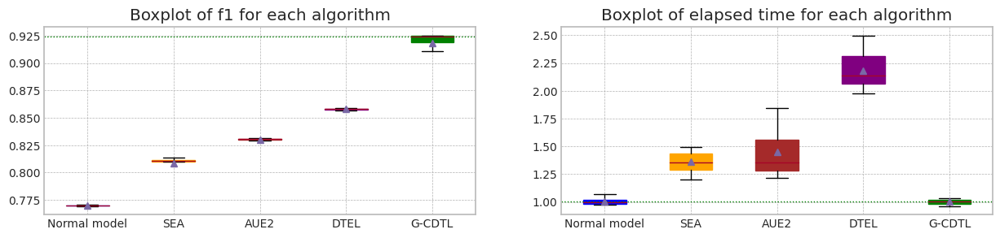

In [46]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,trial_count=20,weight_init=True) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [47]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+5*(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02121, Mean 0.06553, Std 0.04745
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


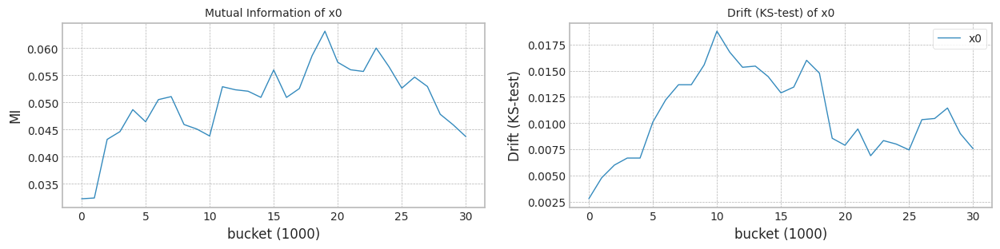

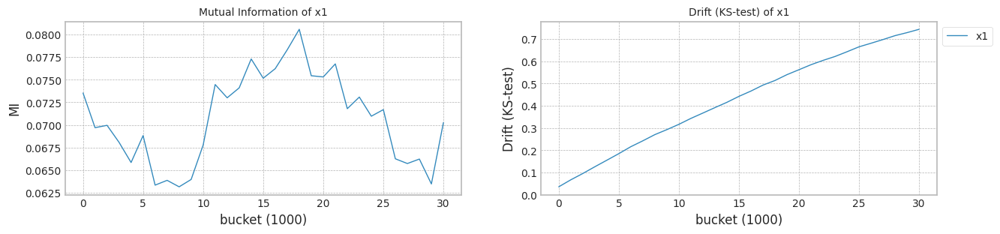

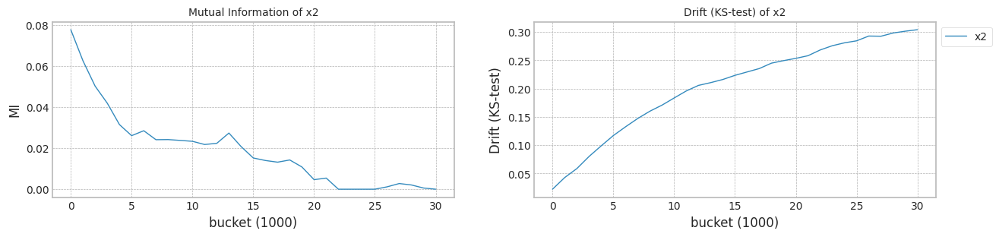

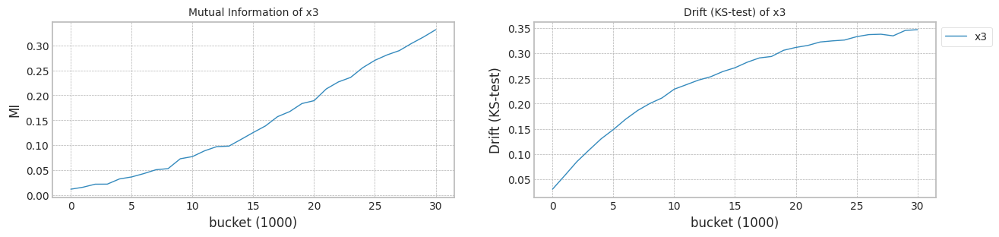

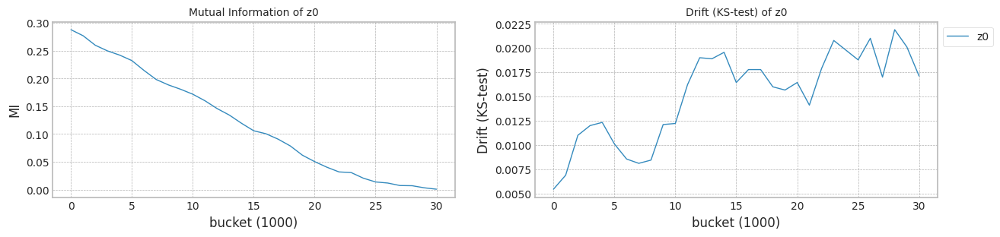

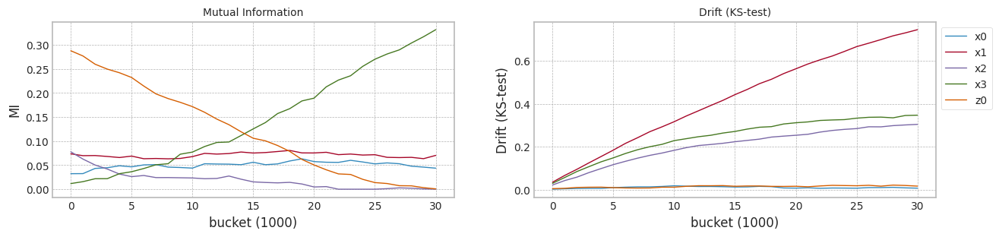

In [48]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [49]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.18it/s]


Test f1 score: 0.917821401077752
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8343082915160401
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.01it/s]


Test f1 score: 0.9203368502565095
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.112330
x1    0.463319
x2    0.680520
x3    0.213122
z0    0.041620
dtype: float64
Mean F1 for all data: 0.8347730691686297
Normal model median        : 0.8343082915160401
Drift tolerant model median: 0.8347730691686297
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.93it/s]


Test f1 score: 0.9176040765311028
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8260073544649871
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.59it/s]


Test f1 score: 0.921154591243704
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.179842
x1    0.426566
x2    0.652878
x3    0.127943
z0    0.099889
dtype: float64
Mean F1 for all data: 0.8347444903512611
Normal model median        : 0.8301578229905135
Drift tolerant model median: 0.8347587797599454
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.57it/s]


Test f1 score: 0.918918918918919
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8376896449775985
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.36it/s]


Test f1 score: 0.9206349206349207
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.198140
x1    0.500237
x2    0.747771
x3    0.144398
z0    0.076441
dtype: float64
Mean F1 for all data: 0.8248487291147955
Normal model median        : 0.8343082915160401
Drift tolerant model median: 0.8347444903512611
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.97it/s]


Test f1 score: 0.9176040765311028
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8270681902888418
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.04it/s]


Test f1 score: 0.9206963249516442
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.245366
x1    0.277029
x2    0.661215
x3    0.238065
z0    0.039839
dtype: float64
Mean F1 for all data: 0.8445173518327798
Normal model median        : 0.830688240902441
Drift tolerant model median: 0.8347587797599454
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 645.67it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6746771622573732
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.02it/s]


Test f1 score: 0.9204501358168412
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.515452
x1    0.469247
x2    0.690373
x3    0.234412
z0    0.157065
dtype: float64
Mean F1 for all data: 0.8575972915235883
Normal model median        : 0.8270681902888418
Drift tolerant model median: 0.8347730691686297
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 648.68it/s]


Test f1 score: 0.918061165608771
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8373743450740706
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.20it/s]


Test f1 score: 0.9205118262892593
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.313204
x1    0.466333
x2    0.698993
x3    0.153065
z0    0.101068
dtype: float64
Mean F1 for all data: 0.8445118729334312
Normal model median        : 0.830688240902441
Drift tolerant model median: 0.8396424710510304
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 648.60it/s]


Test f1 score: 0.9174999999999999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8262583515639887
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.09it/s]


Test f1 score: 0.9205981669078631
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.317068
x1    0.254011
x2    0.171280
x3    0.272351
z0    0.144380
dtype: float64
Mean F1 for all data: 0.845213581764228
Normal model median        : 0.8270681902888418
Drift tolerant model median: 0.8445118729334312
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.14it/s]


Test f1 score: 0.9188149288187765
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8365357693284996
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.95it/s]


Test f1 score: 0.9193721361021742
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.437179
x1    0.339319
x2    0.445301
x3    0.154068
z0    0.180996
dtype: float64
Mean F1 for all data: 0.8311741508922355
Normal model median        : 0.830688240902441
Drift tolerant model median: 0.8396424710510304
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 653.73it/s]


Test f1 score: 0.9191063174114021
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8420112594818273
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.71it/s]


Test f1 score: 0.9214326978625073
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.409398
x1    0.384882
x2    0.576728
x3    0.265591
z0    0.075771
dtype: float64
Mean F1 for all data: 0.8526224767133805
Normal model median        : 0.8343082915160401
Drift tolerant model median: 0.8445118729334312
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 651.31it/s]


Test f1 score: 0.918222051183375
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8349155908783881
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.18it/s]


Test f1 score: 0.9202954898911353
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.194211
x1    0.437459
x2    0.568082
x3    0.153151
z0    0.036530
dtype: float64
Mean F1 for all data: 0.840142231390642
Normal model median        : 0.8346119411972142
Drift tolerant model median: 0.8423270521620366
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 620.47it/s]


Test f1 score: 0.9178939262681681
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.833959455393462
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.99it/s]


Test f1 score: 0.9208842350203607
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.187756
x1    0.443616
x2    0.559778
x3    0.135516
z0    0.065853
dtype: float64
Mean F1 for all data: 0.846393366234055
Normal model median        : 0.8343082915160401
Drift tolerant model median: 0.8445118729334312
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 646.19it/s]


Test f1 score: 0.9177014149581287
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.833054497750442
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.95it/s]


Test f1 score: 0.91964718425899
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.091520
x1    0.313502
x2    0.322516
x3    0.227201
z0    0.066832
dtype: float64
Mean F1 for all data: 0.8391180488113207
Normal model median        : 0.834133873454751
Drift tolerant model median: 0.8423270521620366
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 651.87it/s]


Test f1 score: 0.9181022038302377
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8353631793182801
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.94it/s]


Test f1 score: 0.9205765696043339
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.043792
x1    0.395423
x2    0.253161
x3    0.145075
z0    0.076434
dtype: float64
Mean F1 for all data: 0.8349142013223142
Normal model median        : 0.8343082915160401
Drift tolerant model median: 0.840142231390642
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 650.82it/s]


Test f1 score: 0.9178055822906641
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8342080963337969
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.58it/s]


Test f1 score: 0.9191547111283443
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.373258
x1    0.353491
x2    0.619376
x3    0.141265
z0    0.173824
dtype: float64
Mean F1 for all data: 0.8495695055553738
Normal model median        : 0.8342581939249185
Drift tolerant model median: 0.8423270521620366
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 645.41it/s]


Test f1 score: 0.9174999999999999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8262532287499809
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.06it/s]


Test f1 score: 0.9206102419589933
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.084409
x1    0.373907
x2    0.613280
x3    0.148004
z0    0.051369
dtype: float64
Mean F1 for all data: 0.8428160045942759
Normal model median        : 0.8342080963337969
Drift tolerant model median: 0.8428160045942759
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.27it/s]


Test f1 score: 0.9192975722099607
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8319825510188181
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.16it/s]


Test f1 score: 0.9201513534491121
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.186104
x1    0.288717
x2    0.301563
x3    0.252147
z0    0.172832
dtype: float64
Mean F1 for all data: 0.8540264105288409
Normal model median        : 0.8340837758636295
Drift tolerant model median: 0.8436639387638536
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.04it/s]


Test f1 score: 0.9187993072926688
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8358646171623171
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.45it/s]


Test f1 score: 0.9200427474982998
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.353943
x1    0.522125
x2    0.723280
x3    0.113197
z0    0.178703
dtype: float64
Mean F1 for all data: 0.8268503942953177
Normal model median        : 0.8342080963337969
Drift tolerant model median: 0.8428160045942759
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 653.05it/s]


Test f1 score: 0.9184871523433741
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8375407786884198
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.02it/s]


Test f1 score: 0.9208688906128781
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.031763
x1    0.528892
x2    0.323495
x3    0.146075
z0    0.190659
dtype: float64
Mean F1 for all data: 0.8482641707845245
Normal model median        : 0.8342581939249185
Drift tolerant model median: 0.8436639387638536
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 646.25it/s]


Test f1 score: 0.9189605389797882
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8372402669231696
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.66it/s]


Test f1 score: 0.920422603470001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.058943
x1    0.458387
x2    0.358018
x3    0.281025
z0    0.073133
dtype: float64
Mean F1 for all data: 0.8519723857444722
Normal model median        : 0.8343082915160401
Drift tolerant model median: 0.8445118729334312
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 653.87it/s]


Test f1 score: 0.918414469886473
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8318089704894798
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.74it/s]


Test f1 score: 0.9208160108285798
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.076932
x1    0.439828
x2    0.695057
x3    0.199466
z0    0.067767
dtype: float64
Mean F1 for all data: 0.8411594339166868
Normal model median        : 0.8342581939249185
Drift tolerant model median: 0.8436639387638536
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.58it/s]


Early stop at  2347.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8540033477778909
SEA median: 0.8540033477778909
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.47it/s]


Early stop at  2489.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8531898733824792
AUE median: 0.8531898733824792
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.46it/s]


Early stop at  1777.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8712037383134642
DTEL median: 0.8712037383134642
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.05it/s]


Early stop at  1603.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8476248956334097
SEA median: 0.8508141217056503
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.35it/s]


Early stop at  2852.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8511982494065683
AUE median: 0.8521940613945238
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.22it/s]


Early stop at  2946.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8699529850617075
DTEL median: 0.8705783616875858
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.28it/s]


Early stop at  3083.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8545936252648333
SEA median: 0.8540033477778909
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.40it/s]


Early stop at  2788.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.854922471165559
AUE median: 0.8531898733824792
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.69it/s]


Early stop at  999.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8719380221336143
DTEL median: 0.8712037383134642
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.38it/s]


Early stop at  1045.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8484443294772308
SEA median: 0.8512238386275608
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.75it/s]


Early stop at  2112.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8523314183841668
AUE median: 0.852760645883323
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.62it/s]


Early stop at  1104.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8695918576804047
DTEL median: 0.8705783616875858
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.07it/s]


Early stop at  1492.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7817029382974509
SEA median: 0.8484443294772308
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  1910.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7683093882238977
AUE median: 0.8523314183841668
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1131.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7825564105004666
DTEL median: 0.8699529850617075
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1853.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8563695497564556
SEA median: 0.8512238386275608
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.47it/s]


Early stop at  2463.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8544535712544173
AUE median: 0.852760645883323
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1567.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.871563546232817
DTEL median: 0.8705783616875858
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.26it/s]


Early stop at  1272.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8485290980493336
SEA median: 0.8485290980493336
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.85302758714106
AUE median: 0.85302758714106
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1754.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8692726002099176
DTEL median: 0.8699529850617075
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.06it/s]


Early stop at  3656.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8550477375907446
SEA median: 0.8512662229136123
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.45it/s]


Early stop at  2546.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8547656489585479
AUE median: 0.8531087302617696
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1333.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.871320003366626
DTEL median: 0.8705783616875858
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.38it/s]


Early stop at  2650.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8598342954657605
SEA median: 0.8540033477778909
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1912.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8550857614758062
AUE median: 0.8531898733824792
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.62it/s]


Early stop at  1042.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8722510630205104
DTEL median: 0.8712037383134642
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.30it/s]


Early stop at  1182.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8547232988940706
SEA median: 0.8542984865213621
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.06it/s]


Early stop at  1512.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8532911177135813
AUE median: 0.8532404955480303
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]


Early stop at  2046.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8708098412387958
DTEL median: 0.87100678977613
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.72it/s]


Early stop at  2023.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8533475367333779
SEA median: 0.8540033477778909
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2092.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8535290146985061
AUE median: 0.8532911177135813
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.59it/s]


Early stop at  1155.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8707854581362354
DTEL median: 0.8708098412387958
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.28it/s]


Early stop at  1172.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8528833236427819
SEA median: 0.8536754422556344
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8524710639982068
AUE median: 0.8532404955480303
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1327.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8703481762364915
DTEL median: 0.8707976496875156
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.54it/s]


Early stop at  2481.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8541754940323463
SEA median: 0.8540033477778909
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.49it/s]


Early stop at  2550.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8539613592188172
AUE median: 0.8532911177135813
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2100.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8712221463198978
DTEL median: 0.8708098412387958
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.24it/s]


Early stop at  1227.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8534601050100503
SEA median: 0.8537317263939705
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.18it/s]


Early stop at  1308.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8533346011774438
AUE median: 0.8533128594455126
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.07it/s]


Early stop at  3693.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8703345059549409
DTEL median: 0.8707976496875156
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  2156.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8485420387215299
SEA median: 0.8534601050100503
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.74it/s]


Early stop at  2019.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8520095467217828
AUE median: 0.8532911177135813
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.47it/s]


Early stop at  1674.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8691101308348689
DTEL median: 0.8707854581362354
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.80it/s]


Early stop at  1895.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8565324233430522
SEA median: 0.8537317263939705
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8482402922337806
AUE median: 0.8532404955480303
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.27it/s]


Early stop at  2503.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8689013702591343
DTEL median: 0.8705668171863634
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.58it/s]


Early stop at  2384.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8554018612012704
SEA median: 0.8540033477778909
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.85it/s]


Early stop at  1808.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8541655117831892
AUE median: 0.8532911177135813
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.58it/s]


Early stop at  1297.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8707112800196476
DTEL median: 0.8707112800196476
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8566453193306109
SEA median: 0.8540894209051186
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.94it/s]


Early stop at  1764.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8551055497466181
AUE median: 0.8533128594455126
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1513.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8716507794312583
DTEL median: 0.8707483690779415
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.15it/s]


Early stop at  1420.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8560214184215511
SEA median: 0.8541754940323463
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.54it/s]


Early stop at  2408.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8553557626772142
AUE median: 0.8533346011774438
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.62it/s]


Early stop at  1185.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8712590767198779
DTEL median: 0.8707854581362354
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.31it/s]


Early stop at  1135.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8532370920879804
SEA median: 0.8540894209051186
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1615.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.853216492297317
AUE median: 0.8533128594455126
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.34it/s]


Early stop at  2260.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8704960235826006
DTEL median: 0.8707483690779415


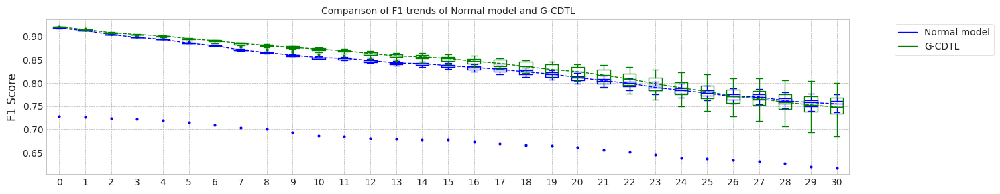

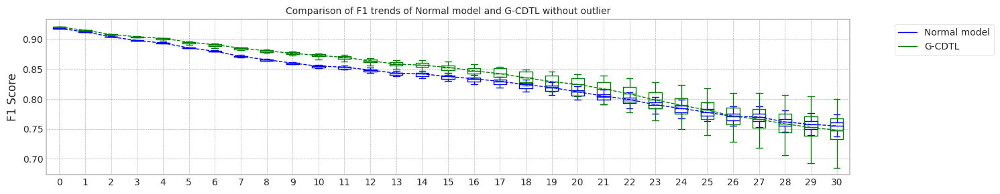

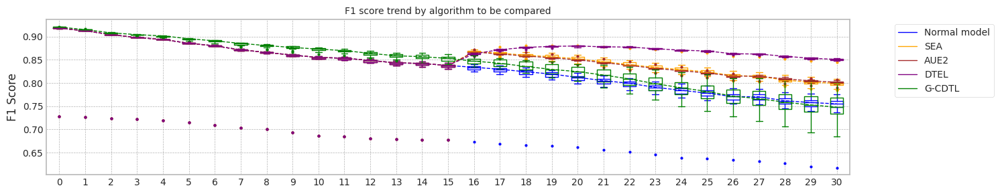

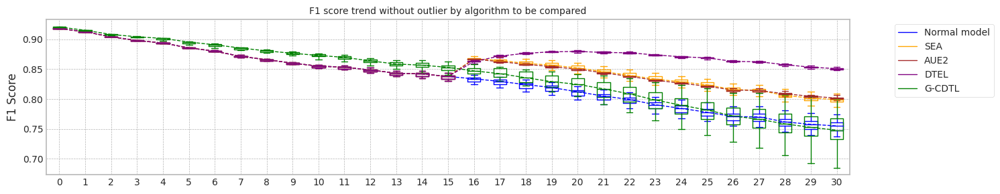

max_mean_trial= 4


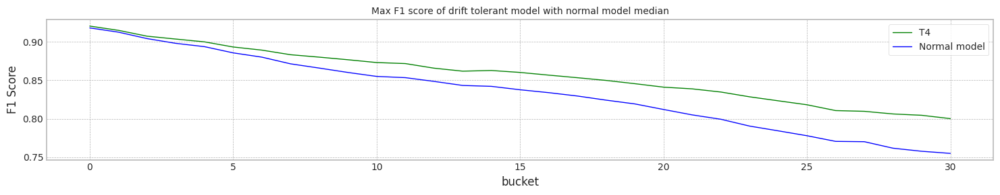

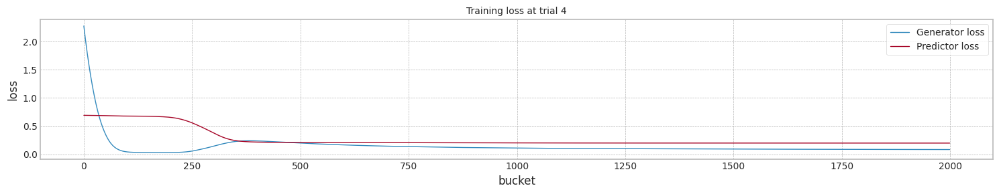

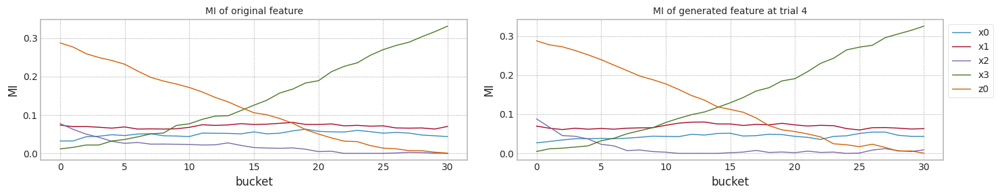

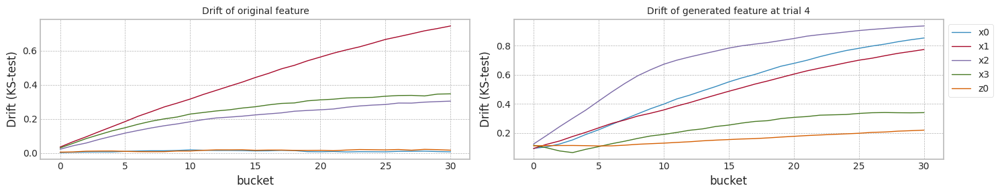

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.917821,0.912304,0.834308,0.754664,5.823390
1,1.0,0.917604,0.912298,0.826007,0.737523,5.839902
2,2.0,0.918919,0.913682,0.837690,0.760789,5.847140
3,3.0,0.917604,0.912298,0.827068,0.739237,5.877196
4,4.0,0.727915,0.726475,0.674677,0.617405,5.792371
5,5.0,0.918061,0.912634,0.837374,0.763688,5.844609
6,6.0,0.917500,0.912089,0.826258,0.737264,6.118566
7,7.0,0.918815,0.913386,0.836536,0.760318,5.888815
8,8.0,0.919106,0.913901,0.842011,0.774862,5.852780
9,9.0,0.918222,0.912584,0.834916,0.756919,5.835900


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.917821,0.912304,0.854003,0.798544,8.717723
1,1.0,0.917604,0.912298,0.847625,0.783935,7.707766
2,2.0,0.918919,0.913682,0.854594,0.795285,9.492580
3,3.0,0.917604,0.912298,0.848444,0.785128,7.126358
4,4.0,0.727915,0.726475,0.781703,0.844864,7.669990
5,5.0,0.918061,0.912634,0.856370,0.802890,8.125636
6,6.0,0.917500,0.912089,0.848529,0.787147,7.322392
7,7.0,0.918815,0.913386,0.855048,0.800000,10.166376
8,8.0,0.919106,0.913901,0.859834,0.809226,9.200878
9,9.0,0.918222,0.912584,0.854723,0.800927,7.257957


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.917821,0.912304,0.853190,0.800209,8.984766
1,1.0,0.917604,0.912298,0.851198,0.797587,9.286690
2,2.0,0.918919,0.913682,0.854922,0.801888,9.159885
3,3.0,0.917604,0.912298,0.852331,0.800208,8.308378
4,4.0,0.727915,0.726475,0.768309,0.806251,8.235618
5,5.0,0.918061,0.912634,0.854454,0.804070,8.982043
6,6.0,0.917500,0.912089,0.853028,0.801751,10.759108
7,7.0,0.918815,0.913386,0.854766,0.803358,9.024122
8,8.0,0.919106,0.913901,0.855086,0.801747,8.157496
9,9.0,0.918222,0.912584,0.853291,0.800292,7.683096


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.917821,0.912304,0.871204,0.850733,12.661262
1,1.0,0.917604,0.912298,0.869953,0.851886,14.033346
2,2.0,0.918919,0.913682,0.871938,0.849777,11.590063
3,3.0,0.917604,0.912298,0.869592,0.851444,11.859353
4,4.0,0.727915,0.726475,0.782556,0.853293,12.238375
5,5.0,0.918061,0.912634,0.871564,0.849966,12.455715
6,6.0,0.917500,0.912089,0.869273,0.849748,12.532351
7,7.0,0.918815,0.913386,0.871320,0.851396,12.217713
8,8.0,0.919106,0.913901,0.872251,0.851809,11.886142
9,9.0,0.918222,0.912584,0.870810,0.851235,13.337843


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.920337,0.915050,0.834773,0.724159,5.870868
1,1.0,0.921155,0.915630,0.834744,0.720065,5.871749
2,2.0,0.920635,0.915208,0.824849,0.694456,5.875775
3,3.0,0.920696,0.915100,0.844517,0.747716,5.866048
4,4.0,0.920450,0.914925,0.857597,0.800173,5.957932
5,5.0,0.920512,0.915202,0.844512,0.755270,5.930934
6,6.0,0.920598,0.914933,0.845214,0.766070,5.930852
7,7.0,0.919372,0.913643,0.831174,0.719899,5.904540
8,8.0,0.921433,0.916241,0.852622,0.784033,5.953107
9,9.0,0.920295,0.915066,0.840142,0.742765,5.898597


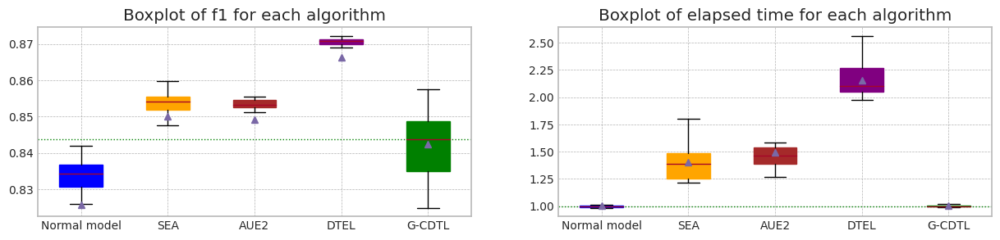

In [50]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,trial_count=20,lr_g=0.001,weight_init=True) #np.max(X1['b'])+1)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [ ]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [ ]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [ ]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:

X[2010].shape

(11497, 81)

In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [ ]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [ ]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

#### 실험

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]



#### do

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


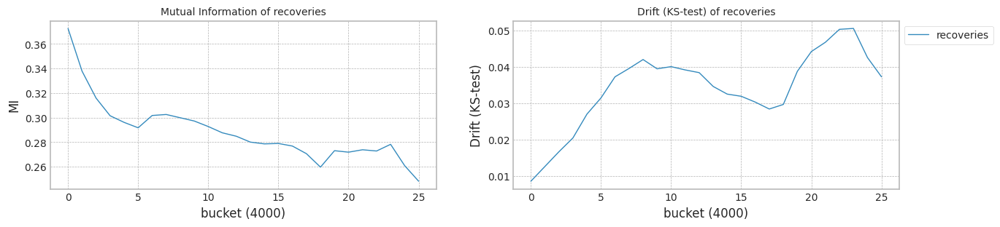

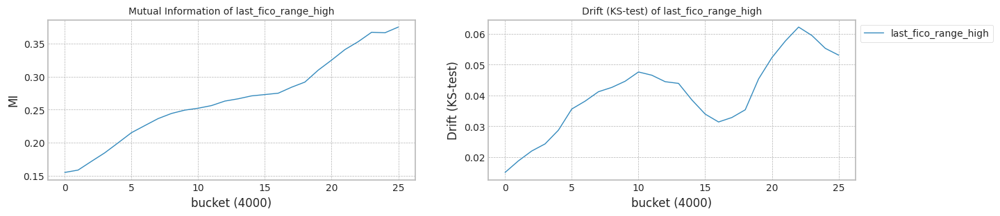

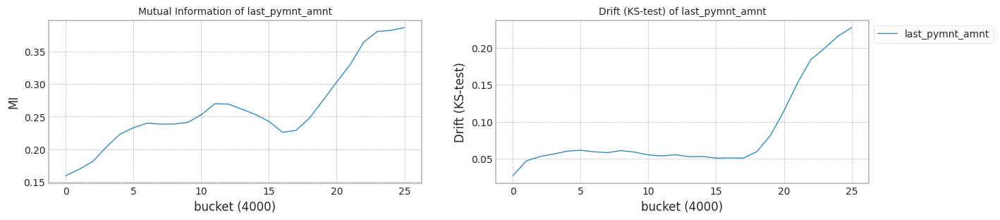

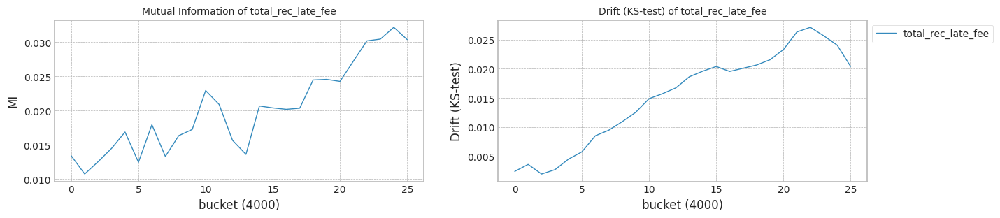

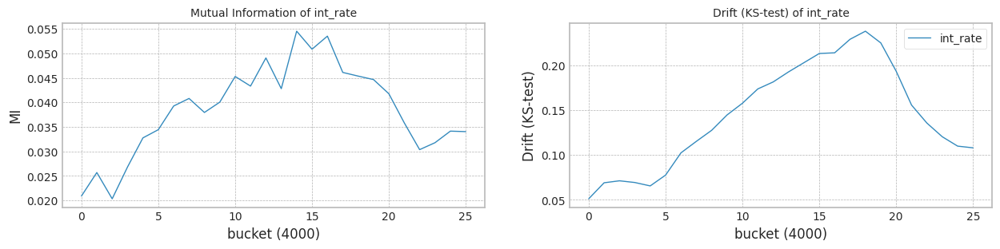

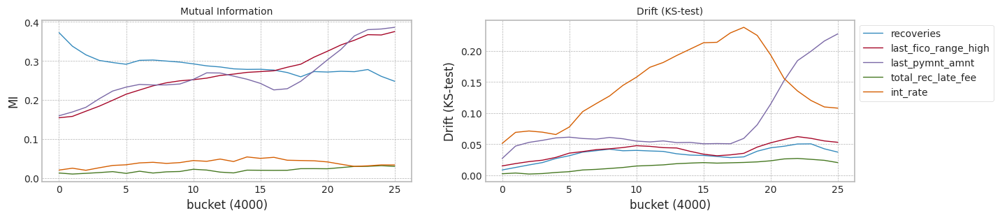

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.24it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.65it/s]


Test f1 score: 0.9629099650849979
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.870098
last_fico_range_high    0.133927
last_pymnt_amnt         0.489763
total_rec_late_fee      0.945494
int_rate                0.153321
dtype: float64
Mean F1 for all data: 0.8996872581697285
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.8996872581697285
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.09it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.45it/s]


Test f1 score: 0.973440574007638
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.859758
last_fico_range_high    0.114825
last_pymnt_amnt         0.489075
total_rec_late_fee      0.965750
int_rate                0.153598
dtype: float64
Mean F1 for all data: 0.9622513322839512
Normal model median        : 0.9004895296926421
Drift tolerant model median: 0.9309692952268398
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.91it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.01it/s]


Test f1 score: 0.9734702733979459
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.860879
last_fico_range_high    0.165769
last_pymnt_amnt         0.083958
total_rec_late_fee      0.965721
int_rate                0.149587
dtype: float64
Mean F1 for all data: 0.9611210686444471
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.9611210686444471
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.74it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.32it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.790958
last_fico_range_high    0.402056
last_pymnt_amnt         0.498523
total_rec_late_fee      0.923838
int_rate                0.135475
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9105347252716585
Drift tolerant model median: 0.9304041634070879
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.46it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.59it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.887754
last_fico_range_high    0.105502
last_pymnt_amnt         0.493342
total_rec_late_fee      0.965750
int_rate                0.160677
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.8996872581697285
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.23it/s]


Test f1 score: 0.9339622641509433
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9151424942160997
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.07it/s]


Test f1 score: 0.9727900991816788
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.847850
last_fico_range_high    0.162983
last_pymnt_amnt         0.485815
total_rec_late_fee      0.921894
int_rate                0.154917
dtype: float64
Mean F1 for all data: 0.9589199045718734
Normal model median        : 0.9134138989085445
Drift tolerant model median: 0.9293035813708009
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.04it/s]


Test f1 score: 0.9137813985064493
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867861910860791
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.77it/s]


Test f1 score: 0.972732267298962
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.896958
last_fico_range_high    0.175465
last_pymnt_amnt         0.482092
total_rec_late_fee      0.946063
int_rate                0.151538
dtype: float64
Mean F1 for all data: 0.944534082862468
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.86it/s]


Test f1 score: 0.9304714833120453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9096420996103313
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.21it/s]


Test f1 score: 0.9734016381580852
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.860069
last_fico_range_high    0.101585
last_pymnt_amnt         0.489681
total_rec_late_fee      0.946879
int_rate                0.141812
dtype: float64
Mean F1 for all data: 0.9331119888460393
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9388230358542536
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.83it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.25it/s]


Test f1 score: 0.9735296670234617
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.827917
last_fico_range_high    0.060956
last_pymnt_amnt         0.244265
total_rec_late_fee      0.965725
int_rate                0.151890
dtype: float64
Mean F1 for all data: 0.9641003331109237
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.12it/s]


Test f1 score: 0.9341360760375729
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9162468130034456
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.57it/s]


Test f1 score: 0.9731027302174918
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.848060
last_fico_range_high    0.133235
last_pymnt_amnt         0.495387
total_rec_late_fee      0.965750
int_rate                0.165944
dtype: float64
Mean F1 for all data: 0.9642193953762479
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9517269937171706
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.53it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.71it/s]


Test f1 score: 0.9733765482115985
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.860127
last_fico_range_high    0.120423
last_pymnt_amnt         0.477862
total_rec_late_fee      0.945490
int_rate                0.160298
dtype: float64
Mean F1 for all data: 0.9290023814188437
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.74it/s]


Test f1 score: 0.9385191652350241
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9233479736340093
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.57it/s]


Test f1 score: 0.9739996525566044
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.859979
last_fico_range_high    0.141852
last_pymnt_amnt         0.476050
total_rec_late_fee      0.993244
int_rate                0.157838
dtype: float64
Mean F1 for all data: 0.9562770077056872
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.36it/s]


Test f1 score: 0.9386105263157895
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9236263800175257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.14it/s]


Test f1 score: 0.9729651583056239
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860463
last_fico_range_high    0.113460
last_pymnt_amnt         0.488113
total_rec_late_fee      0.946233
int_rate                0.169529
dtype: float64
Mean F1 for all data: 0.932463087188154
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.32it/s]


Test f1 score: 0.9179459164162797
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8935746324871745
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.79it/s]


Test f1 score: 0.9730761444807542
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.828319
last_fico_range_high    0.139044
last_pymnt_amnt         0.490571
total_rec_late_fee      0.939117
int_rate                0.153769
dtype: float64
Mean F1 for all data: 0.9598656107093892
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.40it/s]


Test f1 score: 0.9171261669487363
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8928071580545702
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.47it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.860679
last_fico_range_high    0.140956
last_pymnt_amnt         0.504523
total_rec_late_fee      0.941290
int_rate                0.142762
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.14it/s]


Test f1 score: 0.9412096592191379
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9274718720234378
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.49it/s]


Test f1 score: 0.9729948534088937
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.862281
last_fico_range_high    0.123673
last_pymnt_amnt         0.486562
total_rec_late_fee      0.965750
int_rate                0.156248
dtype: float64
Mean F1 for all data: 0.9629926266992987
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.10it/s]


Test f1 score: 0.9374297910581891
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9220949808842456
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.32it/s]


Test f1 score: 0.9731605738084221
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.895225
last_fico_range_high    0.122113
last_pymnt_amnt         0.484865
total_rec_late_fee      0.945437
int_rate                0.153040
dtype: float64
Mean F1 for all data: 0.931010713185035
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.68it/s]


Test f1 score: 0.9355397774920334
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9176229150724697
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.41it/s]


Test f1 score: 0.9679516685845799
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.894488
last_fico_range_high    0.102808
last_pymnt_amnt         0.487221
total_rec_late_fee      0.948494
int_rate                0.147912
dtype: float64
Mean F1 for all data: 0.9028366095822324
Normal model median        : 0.9134138989085445
Drift tolerant model median: 0.9388230358542536
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.53it/s]


Test f1 score: 0.922117866754545
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8991483356899502
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.71it/s]


Test f1 score: 0.9725385905070243
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.832350
last_fico_range_high    0.148819
last_pymnt_amnt         0.493812
total_rec_late_fee      0.926692
int_rate                0.158056
dtype: float64
Mean F1 for all data: 0.9605215715432883
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.97it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.92it/s]


Test f1 score: 0.9729870430356315
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.878879
last_fico_range_high    0.140008
last_pymnt_amnt         0.492702
total_rec_late_fee      0.965750
int_rate                0.154169
dtype: float64
Mean F1 for all data: 0.9705772853503702
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9423881821797414
SEA median: 0.9423881821797414
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  3845.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9417539117668141
AUE median: 0.9417539117668141
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9457371559835414
DTEL median: 0.9457371559835414
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9299702722767407
SEA median: 0.936179227228241
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9310634610571124
AUE median: 0.9364086864119632
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9350062138895063
DTEL median: 0.9403716849365238
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  3897.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9563688828443475
SEA median: 0.9423881821797414
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  3970.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9545981634906476
AUE median: 0.9417539117668141
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3659.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9588455945331561
DTEL median: 0.9457371559835414
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9406694952561414
SEA median: 0.9415288387179415
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:14<00:00,  1.75it/s]


Early stop at  3229.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9407233698247359
AUE median: 0.941238640795775
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448467746445495
DTEL median: 0.9452919653140455
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.57it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9531810954466562
SEA median: 0.9423881821797414
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  3727.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9515799692815418
AUE median: 0.9417539117668141
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.33it/s]


Early stop at  2942.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9555970116116221
DTEL median: 0.9457371559835414
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9439759669307192
SEA median: 0.9431820745552303
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9435089359588402
AUE median: 0.9426314238628272
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.35it/s]


Early stop at  2908.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9478021343341667
DTEL median: 0.9467696451588541
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  3681.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9281829018148964
SEA median: 0.9423881821797414
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9291603643085631
AUE median: 0.9417539117668141
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3723.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9338106729701277
DTEL median: 0.9457371559835414
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9408162424062934
SEA median: 0.9416022122930174
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9396251308331733
AUE median: 0.941238640795775
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448387903583757
DTEL median: 0.9452919653140455
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:14<00:00,  1.75it/s]


Early stop at  2738.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9301159612533076
SEA median: 0.9408162424062934
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9293990344552058
AUE median: 0.9407233698247359
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9343747243111851
DTEL median: 0.9448467746445495
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448714108595353
SEA median: 0.9416022122930174
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  3867.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9439420975618575
AUE median: 0.941238640795775
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3572.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481250379644144
DTEL median: 0.9452919653140455
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9292330845870379
SEA median: 0.9408162424062934
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9301540666797729
AUE median: 0.9407233698247359
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9337936583976619
DTEL median: 0.9448467746445495
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9484871542651742
SEA median: 0.9416022122930174
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9455581195978865
AUE median: 0.941238640795775
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.24it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9517482350837998
DTEL median: 0.9452919653140455
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  3737.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9491201456191385
SEA median: 0.9423881821797414
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  3826.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480181765706004
AUE median: 0.9417539117668141
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  3715.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9516174878119306
DTEL median: 0.9457371559835414
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


Early stop at  3461.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9326450691172934
SEA median: 0.9416022122930174
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9318325721756584
AUE median: 0.941238640795775
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9370397894637189
DTEL median: 0.9452919653140455
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  3684.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.932199501187272
SEA median: 0.9408162424062934
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9324553333110277
AUE median: 0.9407233698247359
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9370408987847886
DTEL median: 0.9448467746445495
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9506924608612907
SEA median: 0.9416022122930174
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481558145417299
AUE median: 0.941238640795775
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9536041805779607
DTEL median: 0.9452919653140455
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480089658696854
SEA median: 0.9423881821797414
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9466324878161967
AUE median: 0.9417539117668141
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9509377910220423
DTEL median: 0.9457371559835414
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9452996272734898
SEA median: 0.9431820745552303
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448030526605002
AUE median: 0.9426314238628272
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.948739975156626
DTEL median: 0.9467696451588541
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.935473949825933
SEA median: 0.9423881821797414
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9357171482552211
AUE median: 0.9417539117668141
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.30it/s]


Early stop at  3620.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9398139348106417
DTEL median: 0.9457371559835414
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9295661814036754
SEA median: 0.9416022122930174
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9304316777321889
AUE median: 0.941238640795775
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9339312963134089
DTEL median: 0.9452919653140455


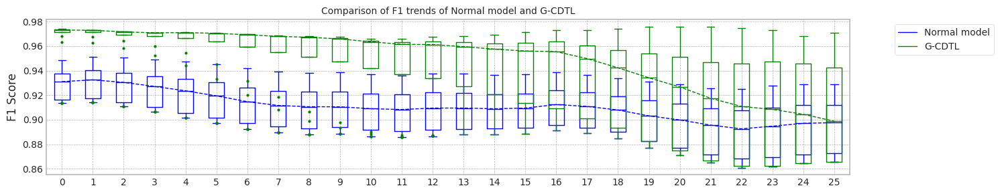

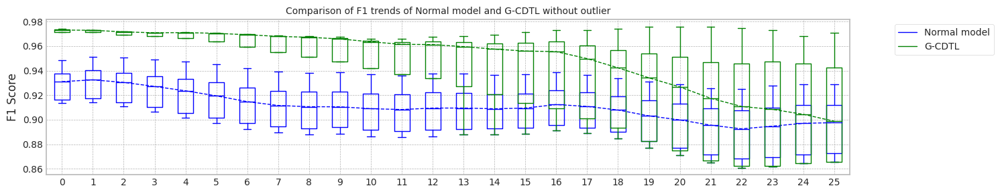

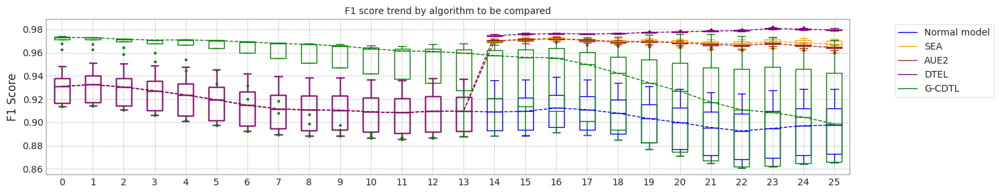

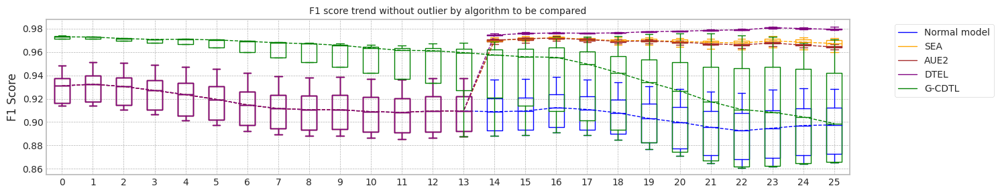

max_mean_trial= 19


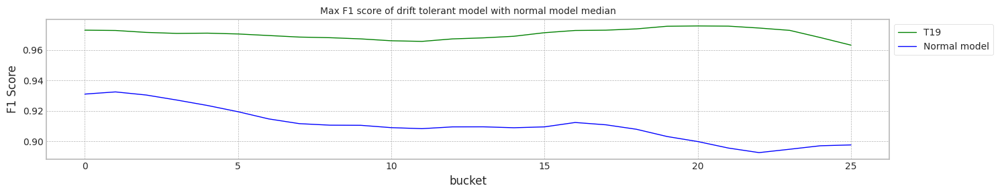

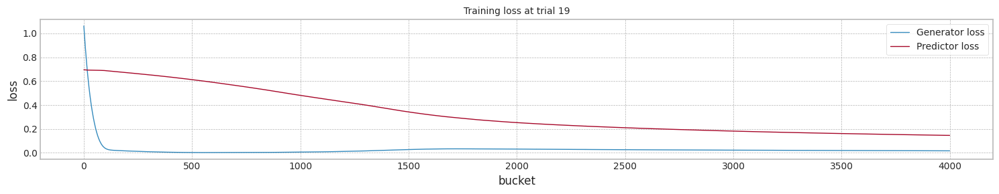

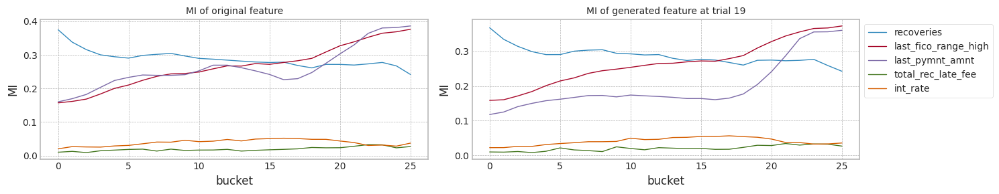

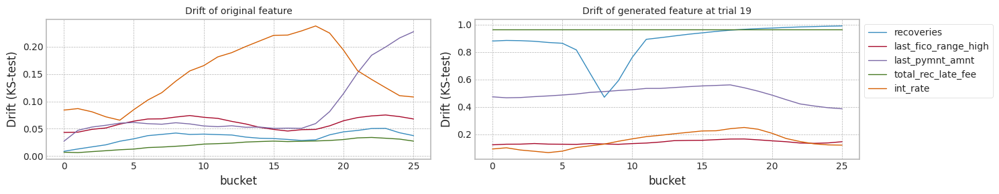

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.911685,0.899187,10.943624
1,1.0,0.914936,0.915483,0.889294,0.869137,11.107749
2,2.0,0.948400,0.951299,0.937524,0.928591,11.077107
3,3.0,0.929945,0.931279,0.909384,0.895627,11.014527
4,4.0,0.943863,0.946336,0.931602,0.923030,10.938602
5,5.0,0.933962,0.935815,0.915142,0.902838,10.936441
6,6.0,0.913781,0.914224,0.886786,0.865555,11.017387
7,7.0,0.930471,0.931903,0.909642,0.896045,10.814813
8,8.0,0.913811,0.914253,0.886793,0.865538,11.104182
9,9.0,0.934136,0.936079,0.916247,0.904848,10.934622


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.942388,0.967395,15.860427
1,1.0,0.914936,0.915483,0.929970,0.962654,16.234294
2,2.0,0.948400,0.951299,0.956369,0.971768,15.724613
3,3.0,0.929945,0.931279,0.940669,0.965399,15.817159
4,4.0,0.943863,0.946336,0.953181,0.971045,16.579235
5,5.0,0.933962,0.935815,0.943976,0.967145,15.968711
6,6.0,0.913781,0.914224,0.928183,0.959821,15.602455
7,7.0,0.930471,0.931903,0.940816,0.968185,15.858483
8,8.0,0.913811,0.914253,0.930116,0.967226,14.895895
9,9.0,0.934136,0.936079,0.944871,0.968814,16.193104


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.941754,0.965576,16.039106
1,1.0,0.914936,0.915483,0.931063,0.965843,16.172135
2,2.0,0.948400,0.951299,0.954598,0.963901,15.951674
3,3.0,0.929945,0.931279,0.940723,0.963867,14.912916
4,4.0,0.943863,0.946336,0.951580,0.965454,16.201480
5,5.0,0.933962,0.935815,0.943509,0.963820,16.070765
6,6.0,0.913781,0.914224,0.929160,0.963746,15.987134
7,7.0,0.930471,0.931903,0.939625,0.962591,15.876507
8,8.0,0.913811,0.914253,0.929399,0.964140,16.292897
9,9.0,0.934136,0.936079,0.943942,0.964903,16.292020


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.945737,0.979266,20.757053
1,1.0,0.914936,0.915483,0.935006,0.980171,20.840945
2,2.0,0.948400,0.951299,0.958846,0.979283,20.163856
3,3.0,0.929945,0.931279,0.944847,0.980001,20.485422
4,4.0,0.943863,0.946336,0.955597,0.978593,19.628727
5,5.0,0.933962,0.935815,0.947802,0.980019,19.228904
6,6.0,0.913781,0.914224,0.933811,0.978918,20.207744
7,7.0,0.930471,0.931903,0.944839,0.979096,20.619964
8,8.0,0.913811,0.914253,0.934375,0.981346,20.760953
9,9.0,0.934136,0.936079,0.948125,0.979233,20.188892


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.962910,0.962584,0.899687,0.865538,10.613886
1,1.0,0.973441,0.973042,0.962251,0.948283,10.678942
2,2.0,0.973470,0.973071,0.961121,0.940375,10.822562
3,3.0,0.913811,0.914253,0.886793,0.865538,10.750808
4,4.0,0.913811,0.914253,0.886793,0.865538,10.761098
5,5.0,0.972790,0.972505,0.958920,0.935090,10.788019
6,6.0,0.972732,0.972533,0.944534,0.883945,10.728482
7,7.0,0.973402,0.973062,0.933112,0.867055,10.688682
8,8.0,0.973530,0.973131,0.964100,0.970981,10.669811
9,9.0,0.973103,0.972929,0.964219,0.958420,10.765936


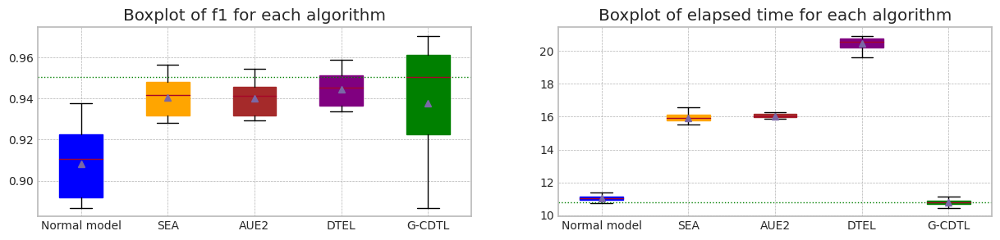

In [ ]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
top_columns
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init= True)

### #2 날짜 단위로 bucket 만들기

#### data 정제

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [ ]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [ ]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,0,1,0,0,0,0,0
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,0,1,0,0
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [ ]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [ ]:
b_cnt = X2.groupby(['b'])['b'].count()

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

In [ ]:
b_cnt2 = X3.groupby(['b'])['b'].count()

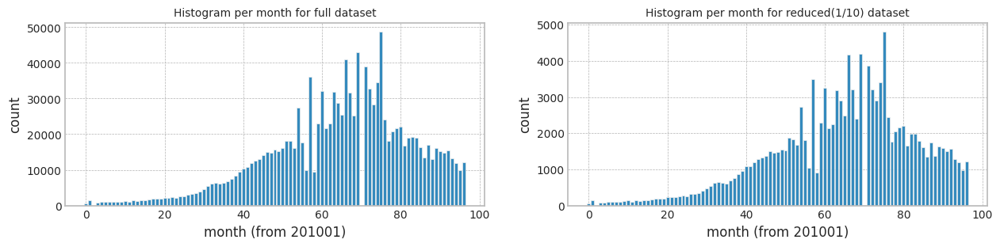

In [ ]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [ ]:
X3.drop(columns=['issue_d'],inplace=True)

In [ ]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
8,9000.0,36,8.94,44000.0,8.97,0.0,749.0,1.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,0
19,21125.0,36,13.92,87000.0,18.33,0.0,704.0,1.0,9.0,0.0,...,0,0,0,1,0,0,0,0,0,0
41,24250.0,36,12.53,287000.0,13.89,0.0,729.0,2.0,15.0,0.0,...,0,0,0,0,0,0,1,0,0,0
43,5000.0,36,13.92,38000.0,5.68,0.0,689.0,1.0,5.0,0.0,...,0,0,0,0,0,0,1,0,0,0
52,13000.0,36,8.59,100000.0,18.35,0.0,784.0,2.0,18.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279596,8000.0,36,7.35,27000.0,22.36,0.0,719.0,0.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279609,29375.0,60,30.75,90000.0,44.94,0.0,689.0,1.0,20.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279627,2500.0,36,10.42,48000.0,25.23,0.0,794.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279639,18500.0,36,13.59,45000.0,35.71,1.0,709.0,0.0,14.0,0.0,...,0,0,0,1,0,0,0,0,0,96


#### Drift tolerant 학습

In [ ]:
from more_itertools import locate
def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

In [ ]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28519, Min 0.01947, Mean 0.17442, Std 0.12009
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:03<00:00, 21.40it/s]


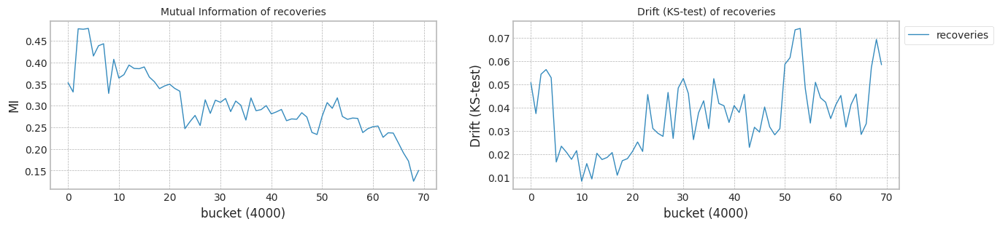

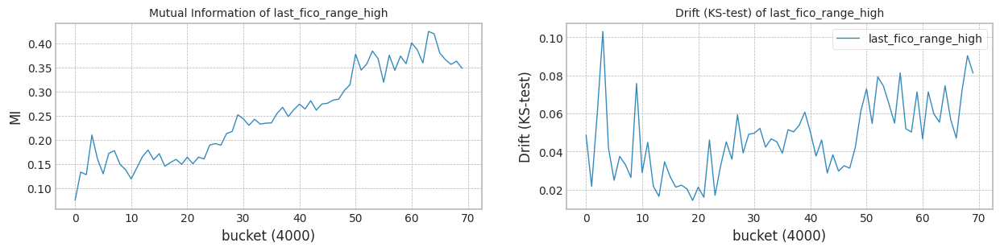

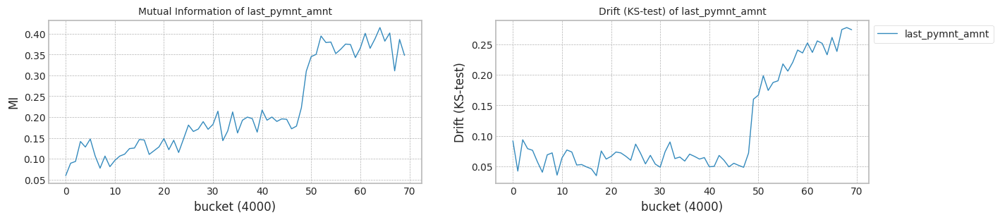

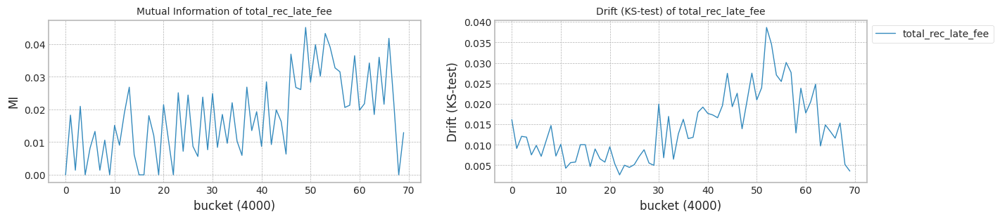

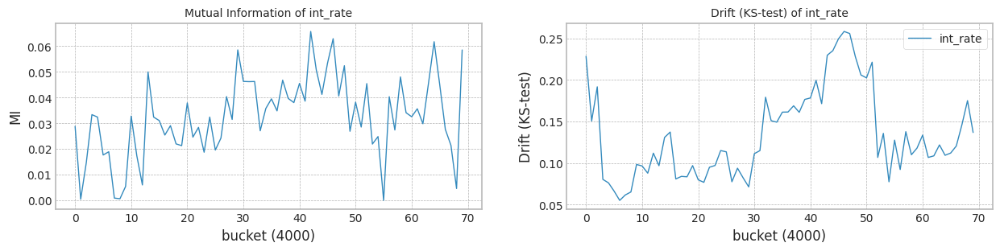

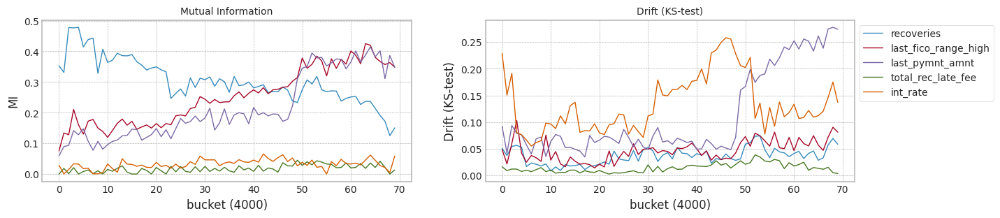

In [ ]:
top_columns = list(mi_scores[0:5].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.76it/s]


Test f1 score: 0.9315611184474939
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9115340040966659
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.03it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.839190
last_fico_range_high    0.118193
last_pymnt_amnt         0.456381
total_rec_late_fee      0.923097
int_rate                0.150386
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.05it/s]


Test f1 score: 0.9149169407201282
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8886184249459659
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.16it/s]


Test f1 score: 0.9734703632887189
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.860508
last_fico_range_high    0.211504
last_pymnt_amnt         0.443587
total_rec_late_fee      0.966117
int_rate                0.145680
dtype: float64
Mean F1 for all data: 0.9604134556403301
Normal model median        : 0.9000762145213159
Drift tolerant model median: 0.9233827116788869
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.66it/s]


Test f1 score: 0.9479673842904911
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9373019960239893
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.60it/s]


Test f1 score: 0.9735576204846276
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.861336
last_fico_range_high    0.061978
last_pymnt_amnt         0.090937
total_rec_late_fee      0.912908
int_rate                0.145516
dtype: float64
Mean F1 for all data: 0.9603925493741498
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9603925493741498
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.57it/s]


Test f1 score: 0.929940685979541
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092146159188006
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.07it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860355
last_fico_range_high    0.226174
last_pymnt_amnt         0.448863
total_rec_late_fee      0.910412
int_rate                0.145422
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9103743100077333
Drift tolerant model median: 0.9233722585457966
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.34it/s]


Test f1 score: 0.9436553860541235
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315481678177596
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.60it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.884093
last_fico_range_high    0.117435
last_pymnt_amnt         0.447276
total_rec_late_fee      0.966117
int_rate                0.148990
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.61it/s]


Test f1 score: 0.9365424160801692
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9198724335082643
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.31it/s]


Test f1 score: 0.9727712426106168
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860938
last_fico_range_high    0.234798
last_pymnt_amnt         0.447830
total_rec_late_fee      0.965842
int_rate                0.148211
dtype: float64
Mean F1 for all data: 0.9598060923729962
Normal model median        : 0.9157032188024651
Drift tolerant model median: 0.9230790300452199
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.36it/s]


Test f1 score: 0.9139202872128572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864040052053528
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.32it/s]


Test f1 score: 0.9729439168607776
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.837472
last_fico_range_high    0.156647
last_pymnt_amnt         0.445722
total_rec_late_fee      0.966117
int_rate                0.144360
dtype: float64
Mean F1 for all data: 0.9602900009592165
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9598060923729962
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.56it/s]


Test f1 score: 0.9305260742355573
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9097677221480565
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.95it/s]


Test f1 score: 0.9735756561248281
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860550
last_fico_range_high    0.129273
last_pymnt_amnt         0.448609
total_rec_late_fee      0.913465
int_rate                0.138646
dtype: float64
Mean F1 for all data: 0.9604171040568438
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9600480466661063
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.77it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.96it/s]


Test f1 score: 0.973677134064358
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.831440
last_fico_range_high    0.060544
last_pymnt_amnt         0.107828
total_rec_late_fee      0.966091
int_rate                0.146404
dtype: float64
Mean F1 for all data: 0.9624386393298676
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.76it/s]


Test f1 score: 0.9341893136803316
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9161468347742108
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.51it/s]


Test f1 score: 0.9733524526498177
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860564
last_fico_range_high    0.121152
last_pymnt_amnt         0.443411
total_rec_late_fee      0.966117
int_rate                0.148492
dtype: float64
Mean F1 for all data: 0.9602839030315502
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.96it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.37it/s]


Test f1 score: 0.9736983681032937
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860521
last_fico_range_high    0.122137
last_pymnt_amnt         0.436490
total_rec_late_fee      0.911517
int_rate                0.149409
dtype: float64
Mean F1 for all data: 0.9606837719568625
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.28it/s]


Test f1 score: 0.9384727272727272
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9232970825838207
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.69it/s]


Test f1 score: 0.9731732090577763
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860891
last_fico_range_high    0.166165
last_pymnt_amnt         0.444770
total_rec_late_fee      0.918991
int_rate                0.149887
dtype: float64
Mean F1 for all data: 0.9602263361246611
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.36it/s]


Test f1 score: 0.9384512799698489
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9236456501804697
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.13it/s]


Test f1 score: 0.9730924294460205
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.860906
last_fico_range_high    0.195657
last_pymnt_amnt         0.449644
total_rec_late_fee      0.911523
int_rate                0.153141
dtype: float64
Mean F1 for all data: 0.9602412325308487
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.55it/s]


Test f1 score: 0.917968970380818
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8931200994189447
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.19it/s]


Test f1 score: 0.9731796188997073
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.860740
last_fico_range_high    0.125030
last_pymnt_amnt         0.442625
total_rec_late_fee      0.966117
int_rate                0.145898
dtype: float64
Mean F1 for all data: 0.9602908523073636
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.14it/s]


Test f1 score: 0.9172563502579572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8923747009005883
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860814
last_fico_range_high    0.135563
last_pymnt_amnt         0.459195
total_rec_late_fee      0.910511
int_rate                0.143804
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602839030315502
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.78it/s]


Test f1 score: 0.9429746521599627
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9299428898111048
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.27it/s]


Test f1 score: 0.9732409509019233
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.834002
last_fico_range_high    0.084274
last_pymnt_amnt         0.445078
total_rec_late_fee      0.966117
int_rate                0.148018
dtype: float64
Mean F1 for all data: 0.9603434862606328
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.80it/s]


Test f1 score: 0.9375380776929995
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221737411901783
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.9732668239792107
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.830893
last_fico_range_high    0.135467
last_pymnt_amnt         0.451978
total_rec_late_fee      0.909254
int_rate                0.145728
dtype: float64
Mean F1 for all data: 0.960804547658361
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602900009592165
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.93it/s]


Test f1 score: 0.9355006351772721
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9174538788626201
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.29it/s]


Test f1 score: 0.9667675508871877
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.829677
last_fico_range_high    0.117879
last_pymnt_amnt         0.436873
total_rec_late_fee      0.912552
int_rate                0.150631
dtype: float64
Mean F1 for all data: 0.9447252871807236
Normal model median        : 0.9138404194354384
Drift tolerant model median: 0.9602869519953834
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.16it/s]


Test f1 score: 0.9221040691904154
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8986969130456073
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.03it/s]


Test f1 score: 0.9730020308206905
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.861000
last_fico_range_high    0.152537
last_pymnt_amnt         0.450206
total_rec_late_fee      0.966117
int_rate                0.148483
dtype: float64
Mean F1 for all data: 0.9601253802381764
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.30it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.37it/s]


Test f1 score: 0.9730843913368187
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860782
last_fico_range_high    0.134715
last_pymnt_amnt         0.447058
total_rec_late_fee      0.966117
int_rate                0.147071
dtype: float64
Mean F1 for all data: 0.9640498487249046
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9434372175874329
SEA median: 0.9434372175874329
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9427118678737009
AUE median: 0.9427118678737009
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9469126677472031
DTEL median: 0.9469126677472031
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315806279513832
SEA median: 0.937508922769408
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9324359392321002
AUE median: 0.9375739035529005
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.936420709499617
DTEL median: 0.94166668862341
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9569764865466575
SEA median: 0.9434372175874329
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3946.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9550165232138966
AUE median: 0.9427118678737009
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  3690.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9594066711429882
DTEL median: 0.9469126677472031
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9421074854913221
SEA median: 0.9427723515393776
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:14<00:00,  1.81it/s]


Early stop at  3269.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9420176664530663
AUE median: 0.9423647671633836
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461391703462567
DTEL median: 0.9465259190467299
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9538313866175009
SEA median: 0.9434372175874329
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3650.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.952187059519167
AUE median: 0.9427118678737009
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9564025409267808
DTEL median: 0.9469126677472031
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3528.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475162616355332
SEA median: 0.945476739611483
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.946717421467241
AUE median: 0.944714644670471
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.38it/s]


Early stop at  3433.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9510743267390125
DTEL median: 0.9489934972431078
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.76it/s]


Early stop at  3619.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9305260838952056
SEA median: 0.9434372175874329
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306094657016183
AUE median: 0.9427118678737009
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:18<00:00,  1.45it/s]


Early stop at  2639.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.935475450892014
DTEL median: 0.9469126677472031
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.942008107484213
SEA median: 0.9427723515393776
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9406764532397117
AUE median: 0.9423647671633836
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461982978843603
DTEL median: 0.9465554828157816
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317845526448318
SEA median: 0.9421074854913221
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9308501150464421
AUE median: 0.9420176664530663
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9359139187835843
DTEL median: 0.9461982978843603
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457952957868749
SEA median: 0.9427723515393776
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3475.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9448210070744087
AUE median: 0.9423647671633836
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.94917462558209
DTEL median: 0.9465554828157816
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306513084101695
SEA median: 0.9421074854913221
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315662820151738
AUE median: 0.9420176664530663
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9355115015239918
DTEL median: 0.9461982978843603
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3652.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9496001424725632
SEA median: 0.9427723515393776
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9463950642864886
AUE median: 0.9423647671633836
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9525449576021937
DTEL median: 0.9465554828157816
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.78it/s]


Early stop at  3378.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9499718199737395
SEA median: 0.9434372175874329
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  3875.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9485428821951696
AUE median: 0.9427118678737009
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.39it/s]


Early stop at  3226.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527050009564293
DTEL median: 0.9469126677472031
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3916.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9343424077103123
SEA median: 0.9427723515393776
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9333091907547976
AUE median: 0.9423647671633836
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9385764663011004
DTEL median: 0.9465554828157816
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338212786420397
SEA median: 0.9421074854913221
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338030503980634
AUE median: 0.9420176664530663
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9384694052188743
DTEL median: 0.9461982978843603
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527689810184283
SEA median: 0.9427723515393776
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9500320997895386
AUE median: 0.9423647671633836
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.955808106952902
DTEL median: 0.9465554828157816
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.948969997656747
SEA median: 0.9434372175874329
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475597986263469
AUE median: 0.9427118678737009
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9519216633367501
DTEL median: 0.9469126677472031
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461353536503341
SEA median: 0.9446162566871539
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457556529523904
AUE median: 0.9437664374740549
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9498098434309357
DTEL median: 0.9480436466646465
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9366234069379338
SEA median: 0.9434372175874329
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9367770884818413
AUE median: 0.9427118678737009
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.36it/s]


Early stop at  3454.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9409907863747304
DTEL median: 0.9469126677472031
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  3956.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9310201869915851
SEA median: 0.9427723515393776
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317932869869191
AUE median: 0.9423647671633836
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9356282927391766
DTEL median: 0.9465554828157816


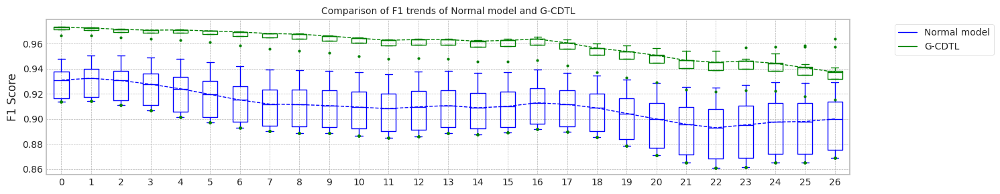

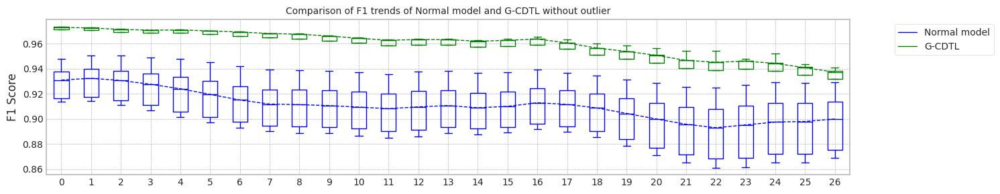

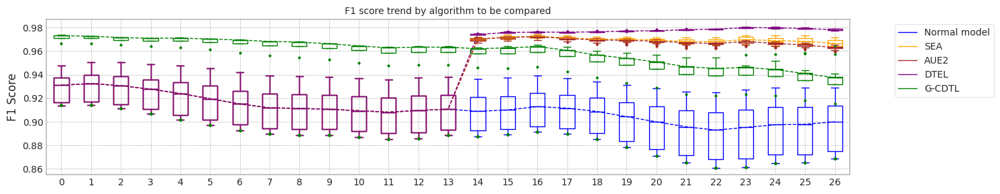

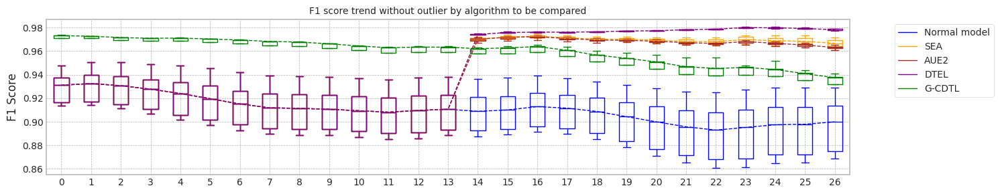

max_mean_trial= 19


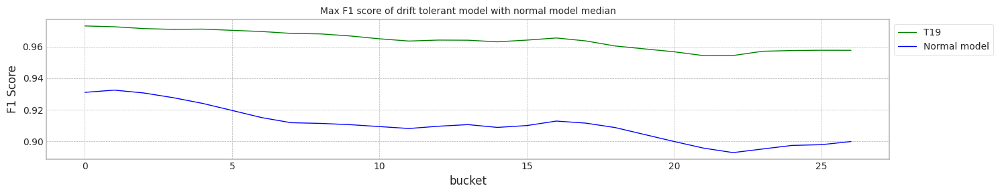

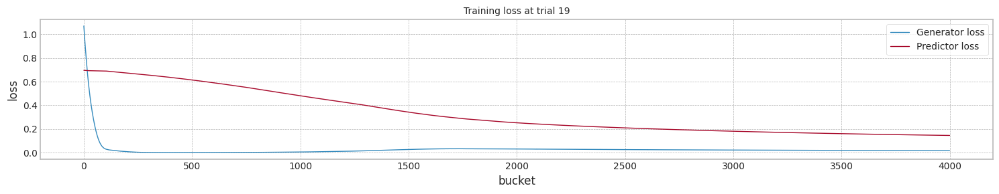

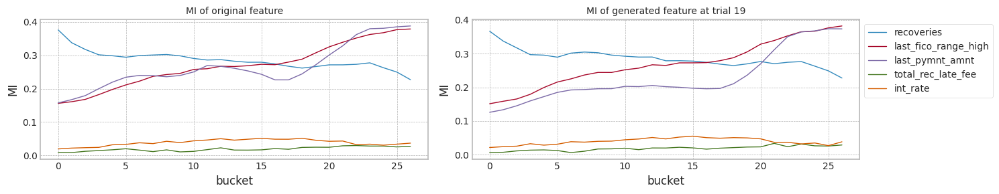

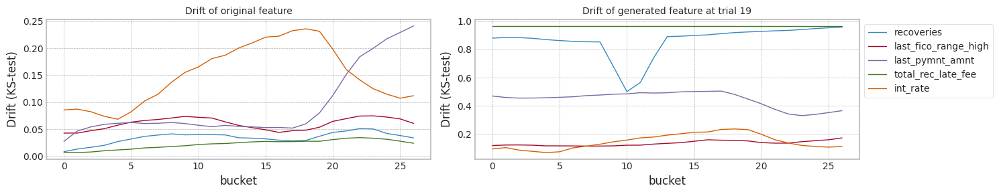

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.911534,0.901259,11.379239
1,1.0,0.914917,0.915411,0.888618,0.871554,11.276924
2,2.0,0.947967,0.950835,0.937302,0.929225,11.182854
3,3.0,0.929941,0.931322,0.909215,0.897891,11.221706
4,4.0,0.943655,0.946107,0.931548,0.924324,11.228681
5,5.0,0.936542,0.938706,0.919872,0.910125,11.439250
6,6.0,0.913920,0.914225,0.886404,0.869075,11.079628
7,7.0,0.930526,0.931928,0.909768,0.898559,11.368684
8,8.0,0.913981,0.914286,0.886352,0.868803,11.125999
9,9.0,0.934189,0.936073,0.916147,0.906747,11.135548


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.943437,0.965954,15.998663
1,1.0,0.914917,0.915411,0.931581,0.962783,15.982797
2,2.0,0.947967,0.950835,0.956976,0.971848,15.749534
3,3.0,0.929941,0.931322,0.942107,0.965733,15.936639
4,4.0,0.943655,0.946107,0.953831,0.969756,16.015630
5,5.0,0.936542,0.938706,0.947516,0.967866,15.249601
6,6.0,0.913920,0.914225,0.930526,0.960847,15.366096
7,7.0,0.930526,0.931928,0.942008,0.967109,15.960129
8,8.0,0.913981,0.914286,0.931785,0.966218,15.760332
9,9.0,0.934189,0.936073,0.945795,0.968102,15.885425


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.942712,0.963624,16.006109
1,1.0,0.914917,0.915411,0.932436,0.964399,16.079503
2,2.0,0.947967,0.950835,0.955017,0.962696,15.924646
3,3.0,0.929941,0.931322,0.942018,0.963589,14.945316
4,4.0,0.943655,0.946107,0.952187,0.964002,15.436364
5,5.0,0.936542,0.938706,0.946717,0.962677,15.864585
6,6.0,0.913920,0.914225,0.930609,0.962097,15.896803
7,7.0,0.930526,0.931928,0.940676,0.960976,15.894116
8,8.0,0.913981,0.914286,0.930850,0.962658,15.799155
9,9.0,0.934189,0.936073,0.944821,0.963314,15.286578


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.946913,0.978014,20.634893
1,1.0,0.914917,0.915411,0.936421,0.979074,20.720251
2,2.0,0.947967,0.950835,0.959407,0.977594,20.119611
3,3.0,0.929941,0.931322,0.946139,0.979047,20.406431
4,4.0,0.943655,0.946107,0.956403,0.977791,20.461607
5,5.0,0.936542,0.938706,0.951074,0.978112,19.575822
6,6.0,0.913920,0.914225,0.935475,0.978087,18.689498
7,7.0,0.930526,0.931928,0.946198,0.977757,20.480794
8,8.0,0.913981,0.914286,0.935914,0.979131,20.451813
9,9.0,0.934189,0.936073,0.949175,0.977773,20.507424


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.913981,0.914286,0.886352,0.868803,11.034705
1,1.0,0.973470,0.972963,0.960413,0.937697,11.098545
2,2.0,0.973558,0.972963,0.960393,0.937372,11.050986
3,3.0,0.913981,0.914286,0.886352,0.868803,11.005542
4,4.0,0.913981,0.914286,0.886352,0.868803,11.009916
5,5.0,0.972771,0.972267,0.959806,0.937461,11.029070
6,6.0,0.972944,0.972438,0.960290,0.939589,10.915220
7,7.0,0.973576,0.972955,0.960417,0.938137,11.038248
8,8.0,0.973677,0.973025,0.962439,0.964127,11.097866
9,9.0,0.973352,0.972875,0.960284,0.937250,11.059224


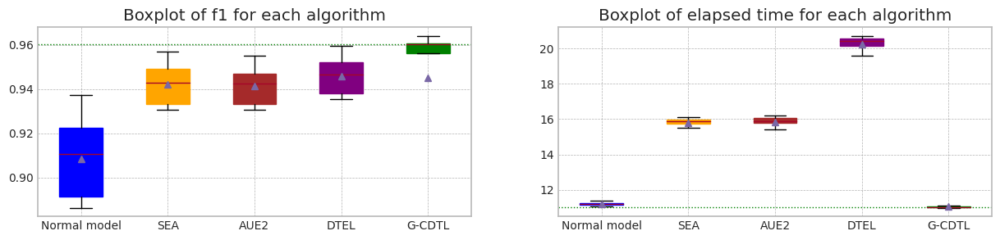

In [ ]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init=True)